# Vodafone Customer Churn Prediction

## 1.0 Introduction

### 1.1 Business Understanding / Project Objective

Per [Paddle](https://www.paddle.com/resources/customer-attrition#:~:text=Customer%20attrition%20is%20defined%20as,of%20business%20health%20over%20time.), customer churn may be defined as the loss of customers by a business. Despite being a normal part of the customer cycle, it is viewed as a key indicator of business health over time and must be managed to ensure some stability in the business' survival, (retention) strategy development, and/or growth. 

It is also known as customer attrition or customer turnover, and is calculated as the percentage of customers that stopped using a company's product or service within a specified timeframe. To better manage customer churn, companies should be able to predict it with reasonable accuracy, and that is where machine learning comes in.

This project is focused on Vodafone - a telecommunications company - and  aims to predict the likelihood that a customer will churn by identifying and modelling based on the key indicators of churn. Possible strategies that may be explored and implemented to improve retention (or reduce churn) may be recommended in this project.

### 1.2 Data Understanding

The dataset contains demographic information about customers, the services that they use, the related charges, and their churn status. The columns in the dataset are described below:

- **Gender**: Whether the customer is a male or a female

- **SeniorCitizen**: Whether a customer is a senior citizen or not

- **Partner**: Whether the customer has a partner or not. Expressed as (Yes, No)

- **Dependents**: Whether the customer has dependents or not. Expressed as (Yes, No)

- **Tenure**: Number of months the customer has stayed with the company.

- **Phone Service**: Whether the customer has a phone service or not. Expressed as (Yes, No)

- **MultipleLines**: Whether the customer has multiple lines or not.

- **InternetService**: Customer's internet service provider. Categorized as (DSL, Fiber Optic, No)

- **OnlineSecurity**: Whether the customer has online security or not. Expressed as (Yes, No, No Internet)

- **OnlineBackup**: Whether the customer has online backup or not. Expressed as (Yes, No, No Internet)

- **DeviceProtection**: Whether the customer has device protection or not. Expressed as (Yes, No, No internet service)

- **TechSupport**: Whether the customer has tech support or not. Expressed as (Yes, No, No internet)

- **StreamingTV**: Whether the customer has streaming TV or not. Expressed as (Yes, No, No internet service)

- **StreamingMovies**: Whether the customer has streaming movies or not. Expressed as (Yes, No, No Internet service)

- **Contract**: The contract term of the customer. Categorized as (Month-to-Month, One year, Two year)

- **PaperlessBilling**: Whether the customer has paperless billing or not. Expressed as (Yes, No)

- **Payment Method**: The customer's payment method. Categorized as (Electronic check, mailed check, Bank transfer(automatic), Credit card(automatic)).

- **MonthlyCharges**: The amount charged to the customer monthly.

- **TotalCharges**: The total amount charged to the customer.

- **Churn**: Whether the customer churned or not. Expressed as (Yes or No).

## 2.0 Hypotheses and Questions

1. Customers with partners & dependents churn less
2. What is the distribution of customers by senior citizenship and how do they churn?
3. In terms of tenure, which range of users have churned least?
4. At what tenure levels do we lose most customers?
5. Customers who exceed the average tenure are less likely to churn
6. Users who don't use phone service churn more than phone service users
7. Does the use of multiple lines lead to reduced churn?
8. DSL users churn more than fibre-optic users
9. Users who stream both TV & movies churn less than those who stream only one
10. Customers with tech support churn less

## 3.0 Toolbox Loading

In [1]:
# Data Manipulation
import numpy as np
import pandas as pd
import sweetviz as sv

# Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Warnings
import warnings
warnings.filterwarnings('ignore')  # Hiding the warnings

# Feature Engineering
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest, chi2  # Univariate Selection using KBest
from sklearn.model_selection import *  #cross_val_score, fbeta_score, KFold, make_scorer, train_test_split, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler

# Models
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb
import xgboost as xgb
from xgboost import *

# Model evaluation
from sklearn import metrics
from sklearn.metrics import *

print("Loading complete.", "Warnings hidden.")

Loading complete. Warnings hidden.


In [2]:
# Removing the restriction on columns to display
pd.set_option('display.max_columns', None)

## 4.0 Data Exploration

In [226]:
# Loading the data
dataset = pd.read_csv("Telco-Customer-Churn.csv")
dataset

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [227]:
# Looking at information about the columns
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [228]:
# Checking for duplicates
dataset[dataset.duplicated()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn


From the dataset preview and the info above, we note the following:
- There are no missing values in any of the columns
- There are no duplicates in the dataset
- Senior Citizenship status is expressed as 0 or 1. It would be ideal to convert to "Yes" or "No" for initial data exploration.
- Despite seeming to have numeric values, the datatype of the TotalCharges column is "object". It will therefore have to be converted to numeric

In [229]:
# Checking the minimum and maximum values in the tenure column
dataset["tenure"].min(), dataset["tenure"].max()

(0, 72)

In [230]:
# What is the total charges for customers with 0 tenure?
dataset[dataset["tenure"] == 0]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


From here, we note that there are 11 customers with 0 tenure and "missing" values for total charges. The values are not present because they do not exist as those customers have not been with Vodafone long enough to incur any actual charges. The values will have to be dropped since they cannot be used in the analysis and predictions.

In [231]:
# Performing initial cleaning on the dataset
dataset["TotalCharges"] = dataset["TotalCharges"].replace(" ", np.nan)  # replacing the empty spaces in the column with nulls
dataset["TotalCharges"] = pd.to_numeric(dataset["TotalCharges"])  # converting the column to a float

dataset["SeniorCitizen"] = np.where(dataset["SeniorCitizen"] == 0, "No", "Yes")  # converting the values to Yes or No

dataset.dropna(inplace= True)  # dropping the null values in the dataset
dataset.drop(columns=["customerID"], inplace=True)  # Dropping the customer ID column
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   object 
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-null   object 
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   object 
 16  PaymentMethod     7032 non-null   object 


*With the columns with no total charges dropped, the dataset now has 7032 non-null distinct entries. We can therefore proceed with further exploration and analysis.*

In [232]:
# Profiling the dataset with SweetViz
my_report = sv.analyze(dataset)
my_report.show_html("Original_data_profile.html")

                                             |                                                                …

Report Original_data_profile.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [233]:
# Looking at the unique values in the columns
for column in dataset.columns:
    if dataset[column].dtype == "O":
        print(f"Distribution of value counts in the {column} column", "\n", dataset[column].value_counts(), "\n")

Distribution of value counts in the gender column 
 Male      3549
Female    3483
Name: gender, dtype: int64 

Distribution of value counts in the SeniorCitizen column 
 No     5890
Yes    1142
Name: SeniorCitizen, dtype: int64 

Distribution of value counts in the Partner column 
 No     3639
Yes    3393
Name: Partner, dtype: int64 

Distribution of value counts in the Dependents column 
 No     4933
Yes    2099
Name: Dependents, dtype: int64 

Distribution of value counts in the PhoneService column 
 Yes    6352
No      680
Name: PhoneService, dtype: int64 

Distribution of value counts in the MultipleLines column 
 No                  3385
Yes                 2967
No phone service     680
Name: MultipleLines, dtype: int64 

Distribution of value counts in the InternetService column 
 Fiber optic    3096
DSL            2416
No             1520
Name: InternetService, dtype: int64 

Distribution of value counts in the OnlineSecurity column 
 No                     3497
Yes             

*Since the output above is not so visually appealing, we will use tables and visualizations to summarize the contents of the various columns* 

### 4.1 Exploration of Numeric Columns

*What is the distribution of the columns with numeric values? Are there any outliers?*

In [234]:
# Looking at the descriptive statistics of the columns with numeric values
numerics = [column for column in dataset.columns if (dataset[column].dtype != "O") & (len(dataset[column].unique()) > 2)]
print("Summary table of the Descriptive Statistics of Columns with Numeric Values")
dataset[numerics].describe()

Summary table of the Descriptive Statistics of Columns with Numeric Values


,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


From the summary table above, we note the following:
- Customers have an average **tenure** of about 32 months, and a median tenure of 29 months. The standard deviation for the tenure is 24.5 months, which is quite high as it implies huge possible variations in the tenure of customers in the dataset
- **Monthly charges** range from USD 18.25 to USD 118.75, and have an average and median of USD 64.80 and USD 70.35 respectively. A standard deviation of USD 30.09 also indicates significant differences between the values in the dataset.
- **Total charges** also range from USD 18.80 to USD 8,684.80, with have an average and median of USD 2,283.30 and USD 1,397.48 respectively. The standard deviation of USD 2,266.77 is quite huge, and indicates large differences between the values in the dataset and the mean.

**Note**:*I assume amounts to be in USD for this project*

In [235]:
# Visualizing the distributions of the columns with numeric values
for column in dataset[numerics].columns:
    if len(dataset[column].unique()) > 2:
        
        # Visualizing the distribution of categories inside the column
        fig = px.box(dataset[numerics], y=column, labels={"color": "Churned", 
                                                          "tenure": "Tenure (months)",
                                                          "MonthlyCharges": "Monthly Charges (USD)",
                                                          "TotalCharges": "Total Charges (USD)"
                                                         },
                     title=f"A visual representation of values in the {column} column"
                    )
        fig.show()
        
        # Visualizing the proportion of churn for each category inside the column
        fig = px.box(dataset[numerics], y=column, color=dataset["Churn"], labels={"color": "Churned",
                                                                                  "tenure": "Tenure (months)",
                                                                                  "MonthlyCharges": "Monthly Charges (USD)",
                                                                                  "TotalCharges": "Total Charges (USD)"
                                                                                 },
                     title=f"A visual representation of values in the {column} column split by churn levels"
                    )
        fig.show()

In addition to the notes from the summary table, here are some notes from the boxplots:

**Tenure**
- Most of the customers are within the first (1 - 29 months) and third quartiles (29 - 55 months), with a significant number being in the area above the median. 
- From the boxplots, customers who passed the 29-month mark generally churned less. Most of the churned customers were from 1 - 29 months. With majority of the customers falling within the 1-29 month group, it was just as understandable as it was concerning that the churn levels were high there. It was understandable because customers could come in and leave at anytime, and that was when they came in the most. It is also concerning because it poses a question of effectiveness on the retention strategy of the "new customers". 
- The insights above answer Q3 and Q4. Based on the plot and the summary table table, we accept the hypothesis in Q5 since customers who exceeded the average tenure (about 32 months) churned less.
- There were a few outliers among the customers who churned, these were customers who had a tenure greater than 70.

**Monthly Charges**
- Monthly charges paid by customers usually ranged between USD 35.58 and USD 89.88, but majority of the customers however were charged between USD 35.78 and USD 70.35. 
- A higher portion of customers fell between the third quartile (USD 89.88) and the maximum value (USD 118.75), than those between the minimum (USD 18.25) and the first quartile (USD 35.58)
- Looking through the "churn lens", customers generally churned more when they crossed USD 56.15 mark, with majority falling between USD 56.15 (lower quartile) and USD 79.65 (median monthly charge of churned customers). 
- A few also seemed to churn regardless of how low or high the monthly charge was.
- For those who stayed, most of them were charged between USD 25.10 and USD 88.49 monthly, with majority of them below the USD 64.45 mark. 
- Per the foregooing and the boxplots, it can be said that - other things being equal - churn levels spiked most when monthly charges exceeded USD 64.45.

**Total Charges**
- Most of our customers' total charges are between USD 401.40 and USD 3,794.98, with the minimum so far being USD 18.80 and the maximum being USD 8,684.80. 
- The data is right skewed, with majority of the customers above the median value USD 1,397.48
- Looking at the churn distribution, most of our customers who churn fall within USD 134.46 and USD 2,332.30, with lower and upper fences of USD 18.85 and USD 5,624.85 respectively. This is quite surprising and may be investigated further as it gives an indication that total charges may not be the sole reason for churn. This is further highlighted by the fact that in the monthly charges, churn levels increased when the charges passed the mean, but that is not the case with the total charges where most customers churned while total charges were below the mean.
- There were a few outliers for those who churned, with a number of customers falling outside the upper fence.
- There were no outliers among those who stayed.
- We also note that most of those who stayed were between USD 577.49 and USD 4,264.19, with a majority falling above the USD 1,683.60 median.
- It may be worthy of note that customers who stayed long enough to pay beyond USD 2,332.30 total charges were less likely to churn.

### 4.2 Exploration of Categorical Columns

In [236]:
# Visualizing the distribution of the columns with categorical values and their churn levels
categoricals = [column for column in dataset.columns if (dataset[column].dtype == "O")]

for column in dataset[categoricals].columns:
    # Visualizing the distribution of the categories in the column
    fig = px.histogram(dataset, x= dataset[column], text_auto = True, title= f"Distribution of values in the {column} column")
    fig.show()
    
    # Visualizing the churn proportions of the categories in the column
    fig = px.histogram(dataset, x= dataset[column], color= "Churn", barnorm= "percent", text_auto= ".2f",
                       title=f"Churn proportions of users in {column} column")
    fig.show()

Here are some observations on the categorical columns with regard to the charts:
- **Gender**: The dataset is fairly distributed between the two genders. A similar thing holds for their churn proportions, with females (26.96%) having a churn level just a little above that of males (26.20%)
- **Senior Citizen**: The dataset has more non-senior citizens (5,890) than senior citizens (1,142). Interestingly enough, senior citizens (41.68%) were more likely to churn than non-senior citizens (23.65%). This answers Q2 on the distribution of customers by senior citizenship and how they churn.
- **Partner**: The dataset was fairly distributed between customers with partners and those without. Here, customers with partners (19.72%) were less likely to churn that those without partners (32.98%).
- **Dependents**: Interestingly enough, there were more customers without dependents (4,933) than those with dependents (2,099). Unsurprisingly, in terms of proportion, customers without dependents (31.98%) churned over twice as much as those with dependents did (15.53%)
- **Phone Service**: There were significantly more Phone Service users (6,352) than non-phone service users (680). The churn proportions among the categories were similar; phone service users had a proportion of 26.75% while non-phone service users had a 25% churn proportion. Based on this finding, the hypothesis at Q6 is rejected as phone service users churn more than non-phone service users.
- **Multiple Lines**: There was a significant difference between multiple line users (2,967) and customers who do not use multiple lines (3,385). The churn proportions were not so far apart, with non-multiple line users having a proportion of 25.08% while multiple line users had 28.65%. Based on this, the hypothesis in Q7 is rejected as the use of multiple lines did not lead to reduced churn.
- **Internet Service**: A large number of customers used fibre-optic internet services (3,096). This was followed by DSL users (2,416) and then 1,520 who did not use internet services. Unfortunately, fibre-optic service users were over twice as likely to churn as compared to DSL users (41.89% vs. 19.00%). Non-internet users had the least churn proportion, at 7.43%. With this finding, the hypothesis in Q8 is rejected, as DSL users do not churn more than fibre-optic users.
- **Online Security**: Over 70% of the customers did not use online security services, This reflected in the churn proportions, as customers who did not use online security (but used internet services) had a churn proportion of 41.78% as opposed to 14.64% for the customers who used online security.
- **Online Backup**: The distribution here was not so different from the Online Security, as there were more non-users than users. Again, non-users had a churn proportion of about 40% while the proportion of online backup users who churned was about 22%.
- **Device Protection**: Here too, about 65% of the customers did not use device protection, and had a churn proportion of 39.14%.
- Looking at the trend in service usage and the related churn proportions of services which were not used by customers so far, it may be inferred that customers who used few services were not getting enough value-for-money and were more likely to churn. Vodafone may investigate this further, and assess which combination of services, when used by customers, had the least proportion of churn. This would inform strategies in service bundle offerings and reduce overall customer churn in the long run.
- **Tech Support**: Less than 29% of customers used the Tech Support services provided by the company. The churn proportion for this group of customers was 15.20%, whilst customers who did not receive tech support had a churn rate of 41.65%. This was particularly concerning, as tech support is critical to tech service delivery. Based on this, we may accept the hypothesis in Q10 because customers with tech support churn less.
- **Streaming: TV**: There was a small between the number of internet service users who streamed TV (2,703) and those who didn't (2,809). The churn proportions for the groups were not so far off, with 30.11% for TV streamers and 33.54% for non-TV streamers. This was particularly concerning, because other things being equal, it would've been expected that at least one would be significantly lower than the other. But with relatively high churn proportions for both streamers and non-streamers, Vodafone may want to take immediate steps to resolve the churn among TV streamers. Initial steps may include surveys to understand customer preferences. It may also consider A/B testing new content for customers and evaluate the results.
- **Streaming: Movies**: There was a good balance between internet service users who streamed movies and those who didn't. The churn proportions told a similar story; 29.95% of movie streamers churned while 33.73% of non-streamers churned. This implied that one was just as likely to churn as they were to stay regardless of their movie streaming status. But like with the TV streamers, if someone who does not stream has just as high a chance of churning as someone who streams, then the movie streaming service has to be evaluated and improved.
- **Contract**: Month-to-month contract customers (3,875) were more than the sum of one-year and two-year contract users (3,157). Understandably, the month-to-month contract customers had the highest churn proportion (42.71%) among the 3 categories. The proportion was however too high and may have to be explored to find long term solutions. In the meantime, looking at the churn proportions for one year contracts (11.28%) and two-year contracts (2.85%) Vodafone may want to explore 3-month and 6-month contracts to try and keep customers for longer periods. This, in combination with other service improvements, will likely increase switching costs for customers as they may have signed up to way too many services with Vodafone to let go in the long run.
- **Paperless Billing**: About 59% of the customers used paperless billing, out of which 33.59% churned. The churn proportion was more than double that of those who did not use paperless billing (16.38%).
- **Payment Method**: About 33% of the customers use electronic checks for their payments, the rest are fairly distributed among the other methods of payment. While the churn proportions for the other payment methods are about 17.06% on average, the proportion for electronic check is 45.29% (more than double the average for the other 3). This is quite concerning, and should be investigated. In the meantime, Vodafone may take steps to improve their electronic check payment method to ensure convenience and ease of use for customers.

### 4.3 Answering the other questions

#### Q1: Customers with partners & dependents churn less

In [14]:
# Extracting the data on customers with partners and dependents
pnd = dataset.loc[(dataset["Partner"] == "Yes") & (dataset["Dependents"] == "Yes")]
pnd.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
10,Male,No,Yes,Yes,13,Yes,No,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Mailed check,49.95,587.45,No
15,Female,No,Yes,Yes,69,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Two year,No,Credit card (automatic),113.25,7895.15,No
18,Female,No,Yes,Yes,10,Yes,No,DSL,No,No,Yes,Yes,No,No,Month-to-month,No,Credit card (automatic),55.20,528.35,Yes
24,Male,No,Yes,Yes,49,Yes,No,DSL,Yes,Yes,No,Yes,No,No,Month-to-month,No,Credit card (automatic),59.60,2970.30,No
26,Male,No,Yes,Yes,47,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.35,4749.15,Yes


In [15]:
# Getting the Churn proportions for customers with partners and dependents
pnd_churn_status = pd.DataFrame(pnd["Churn"].value_counts()).reset_index()
pnd_churn_status.columns = ["Churned", "Count"]
pnd_churn_status["Percent of Total"] = (pnd_churn_status["Count"]/pnd_churn_status["Count"].sum())*100
pnd_churn_status

,Churned,Count,Percent of Total
0,No,1491,85.689655
1,Yes,249,14.310345


In [16]:
# Extracting the data on customers without partners and dependents
no_pnd = dataset.loc[(dataset["Partner"] == "No") & (dataset["Dependents"] == "No")]
no_pnd.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
1,Male,No,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,No,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,No,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,Female,No,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,Yes


In [17]:
# Getting the Churn proportions of customers without partners and dependents
no_pnd_churn_status = pd.DataFrame(no_pnd["Churn"].value_counts()).reset_index()
no_pnd_churn_status.columns = ["Churned", "Count"]
no_pnd_churn_status["Percent of Total"] = (no_pnd_churn_status["Count"]/no_pnd_churn_status["Count"].sum())*100
no_pnd_churn_status

,Churned,Count,Percent of Total
0,No,2157,65.762195
1,Yes,1123,34.237805


From the summary tables above, we note that customers with both partners and dependents churn less than customers without both. The churn percentages are 14.31% and 34.24% respectively. With this in mind, Vodafone may want to develop packages and/or tailor services to customers with both partners and dependents to increase revenue from that group. On the other hand, given that about 46.64% of the total customers belong to the other group (which churns more), Vodafone may want to develop attractive packages to reduce the churn among that group.

#### Q9: Users who stream both TV & movies churn less than those who stream only one

In [21]:
# Extracting the data on customers who stream both movies and TV
stream_both = dataset.loc[(dataset["StreamingMovies"] == "Yes") & (dataset["StreamingTV"] == "Yes")]
stream_both = pd.DataFrame(stream_both["Churn"].value_counts()).reset_index()
stream_both.columns = ["Churned", "Count"]
stream_both["Percentage"] = (stream_both["Count"]/stream_both["Count"].sum())*100
stream_both

,Churned,Count,Percentage
0,No,1368,70.551831
1,Yes,571,29.448169


In [22]:
# Extracting the data on customers who stream both movies or TV
stream_one = dataset.loc[(dataset["StreamingMovies"] == "Yes") | (dataset["StreamingTV"] == "Yes")]
stream_one = pd.DataFrame(stream_one["Churn"].value_counts()).reset_index()
stream_one.columns = ["Churned", "Count"]
stream_one["Percentage"] = (stream_one["Count"]/stream_one["Count"].sum())*100
stream_one

,Churned,Count,Percentage
0,No,2434,69.642346
1,Yes,1061,30.357654


Based on the summary tables above, we accept the hypothesis, as the churn proportion for customers who streamed both TV and movies (29.45%) was less than the churn proportion of those who streamed either service (30.36%). It must however be noted that the difference in proportion between the sets is not that much, i.e. a customer who streams both is just as likely to churn as one who streams either service.

## 5.0 Feature Engineering
### 5.1 Feature Encoding

In [23]:
# Looking at the unique values in each column
dataset.nunique()

gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                72
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1584
TotalCharges        6530
Churn                  2
dtype: int64

**Preview**

Here, the columns with two unique values (yes or no) will be encoded using label encoding, where 1 is assigned to yes and 0 assigned to no.

For gender, since there is no ordinal arrangement between the two categories (male and female), it will be encoded using one-hot encoding.

The rest of the categorical columns will also be encoded using one-hot encoding.

The first columns will be dropped for all the columns that are encoded using one-hot encoding.

The numeric columns (tenure, monthly charges, and total charges) will be scaled using the MinMaxScaler to ensure that their structure/distributions are preserved.

In [24]:
# Encoding the categorical columns with two unique values
two_unique_vals = ["Churn", "SeniorCitizen", "Partner", "Dependents", "PhoneService", "PaperlessBilling"]

for column in two_unique_vals:
    dataset[column] = dataset[column].replace({"Yes": 1, "No": 0})
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,1,0,1,0,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,1,Electronic check,29.85,29.85,0
1,Male,0,0,0,34,1,No,DSL,Yes,No,Yes,No,No,No,One year,0,Mailed check,56.95,1889.50,0
2,Male,0,0,0,2,1,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,1,Mailed check,53.85,108.15,1
3,Male,0,0,0,45,0,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,Female,0,0,0,2,1,No,Fiber optic,No,No,No,No,No,No,Month-to-month,1,Electronic check,70.70,151.65,1


In [25]:
ohencode = [
    "gender", "MultipleLines", "InternetService", "OnlineSecurity", "OnlineBackup", "DeviceProtection",
    "TechSupport", "StreamingTV", "StreamingMovies", "Contract", "PaymentMethod"
           ]

In [26]:
# Encoding the variables using one-hot encoding
encoded_variables = pd.get_dummies(data= dataset[ohencode], prefix= ohencode, drop_first = True)
encoded_variables.head()

,gender_Male,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1
2,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [27]:
# Creating the final training dataframe
complete_set = dataset.join(encoded_variables, on= dataset.index, rsuffix= "_right")
complete_set.drop(columns= ohencode, inplace= True)
complete_set.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,gender_Male,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,0,1,0,1,29.85,29.85,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,34,1,0,56.95,1889.50,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1
2,0,0,0,2,1,1,53.85,108.15,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,45,0,0,42.30,1840.75,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
4,0,0,0,2,1,1,70.70,151.65,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [28]:
complete_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   SeniorCitizen                          7032 non-null   int64  
 1   Partner                                7032 non-null   int64  
 2   Dependents                             7032 non-null   int64  
 3   tenure                                 7032 non-null   int64  
 4   PhoneService                           7032 non-null   int64  
 5   PaperlessBilling                       7032 non-null   int64  
 6   MonthlyCharges                         7032 non-null   float64
 7   TotalCharges                           7032 non-null   float64
 8   Churn                                  7032 non-null   int64  
 9   gender_Male                            7032 non-null   uint8  
 10  MultipleLines_No phone service         7032 non-null   uint8  
 11  Mult

In [29]:
# Profiling the final dataframe with SweetViz
final_df_report = sv.analyze(complete_set)
final_df_report.show_html(filepath= "final_df_report.html")

                                             |                                                                …

Report final_df_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### 5.2 Feature Selection

#### 5.2.1 Correlation Matrix

In [30]:
# Looking at the correlation between the variables in the merged dataframe
correlation = pd.DataFrame(complete_set.corr())

# Defining a colourscale for the correlation plot
colorscale = [[0.0, "rgb(255,255,255)"], [0.2, "rgb(255, 255, 153)"],
              [0.4, "rgb(153, 255, 204)"], [0.6, "rgb(179, 217, 255)"],
              [0.8, "rgb(240, 179, 255)"], [1.0, "rgb(255, 77, 148)"]
             ]

# Plotting the Correlation Matrix
fig = px.imshow(correlation,
                text_auto= ".3f",
                aspect= "auto",
                labels= {"color": "Correlation Coefficient"},
                contrast_rescaling= "minmax",
                color_continuous_scale= colorscale
               )
fig.update_xaxes(side="top")
fig.show()

The correlation matrix presents a more comprehensive view on the nature of the relationships between the various variables  in the dataset, but it is not so clear due to the number of features. As such, other methods will be used to explore the features and their potential importances for the modelling process.

#### 5.2.2 Feature Selection using SelectKBest

In [31]:
# Defining the target & predictor variables
X = complete_set.drop(columns=["Churn"])
y = complete_set["Churn"]

# Splitting the dataframe into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25, random_state= 24, stratify= y)

In [32]:
# Fitting the variables to the function
best_features = SelectKBest(score_func= chi2, k= "all")
fit = best_features.fit(X_train, y_train)

# Looking at the features & their importances
feature_scores = pd.DataFrame(fit.scores_)
selected_columns = pd.DataFrame(X_train.columns)
columns_x_scores = pd.concat([selected_columns, feature_scores], axis=1)
columns_x_scores.columns = ["Feature", "Score"]

print(columns_x_scores.nlargest(10, "Score"))  # print 10 largest scores & features

                                 Feature          Score
7                           TotalCharges  485069.146601
3                                 tenure   12526.860513
6                         MonthlyCharges    2669.688047
26                     Contract_Two year     366.725609
28        PaymentMethod_Electronic check     341.682045
11           InternetService_Fiber optic     276.904874
12                    InternetService_No     210.460126
13    OnlineSecurity_No internet service     210.460126
15      OnlineBackup_No internet service     210.460126
17  DeviceProtection_No internet service     210.460126


In [224]:
# Visualizing the top 10 most important features
fig = px.bar(columns_x_scores.nlargest(10, "Score"), x= "Feature", y= "Score")
fig.show()

From the plot and table above, we note that the top 5 most important features for churn prediction are total charges (by a mile), tenure, monthly charges, 2-year contracts, and electronic check payment method.

#### 5.2.3 Feature Importance using Extra Trees Classifier

In [34]:
# Instantiating the Classifier and fitting it to the training data
etc_model = ExtraTreesClassifier()
etc_model.fit(X_train, y_train)
print(etc_model.feature_importances_)

[0.02698548 0.02922807 0.02470959 0.15354635 0.00536442 0.0305264
 0.12264937 0.1491995  0.036466   0.00568895 0.02489817 0.04452295
 0.00486636 0.00486147 0.0306751  0.0062718  0.0287432  0.00507799
 0.02683567 0.00458652 0.02921739 0.0056352  0.02335698 0.00390947
 0.02347283 0.0295449  0.03537158 0.01702423 0.0521203  0.01464374]


In [35]:
# Creating a dataframe of the features and their importances for plotting
feature_importance_lvls = pd.DataFrame(etc_model.feature_importances_, index=X_train.columns).reset_index()
feature_importance_lvls.rename(columns= {"index": "Feature", 0: "Importance"
                                        },
                               inplace= True
                              )

feature_importance_lvls.sort_values(by= "Importance", ascending= False, inplace= True)
feature_importance_lvls.head(10)

,Feature,Importance
3,tenure,0.153546
7,TotalCharges,0.149200
6,MonthlyCharges,0.122649
28,PaymentMethod_Electronic check,0.052120
11,InternetService_Fiber optic,0.044523
8,gender_Male,0.036466
26,Contract_Two year,0.035372
14,OnlineSecurity_Yes,0.030675
5,PaperlessBilling,0.030526
25,Contract_One year,0.029545


In [36]:
# Visualizing the top 20 most important features
fig = px.bar(feature_importance_lvls[:20], x="Feature", y="Importance")
fig.show()

Going by the results of the ExtraTreesClassifier (above), the top 5 most important features for churn prediction are tenure, total charges, monthly charges, electronic check payment method, and fibre optic internet service. This matches, to a large extent, the results from the SelectKBest model which also suggested 4 of the top 5 features here.

For now, no features will be removed before the modelling process.

## 6.0 Modelling*
**With regard to the imbalance in the dataset*

**Preview**

1. Train_test_split
    
For the modelling, the already defined train data (from Section 5.2.2) will be split again into training and testing so that the models that will be built will be cross-validated and evaluated based on them.

The test data (from Section 5.2.2) above will be the holdout sample. It is on this data that the best model(s) will make their predictions and have their final evaluation.

To do this, the X_train and y_train will be put together as "train_data" before being split into the train and test samples.
The X_test and y_test will also be put together as "test_data" but will not be split until it is time for prediction and final evaluation of the best model(s).

    
2. Dataset Balancing

Given that the dataset is imbalanced, it would have to be balanced before modelling to reduce the error in prediction since our target is the minority class. The 3 most common methods for balancing are oversampling, undersampling, and SMOTE. Since this project doubles as a study opportunity, I will apply each method to (copies of) the training data and build models under each. The models will then be evaluated before selecting the best one(s) for optimization and application on the final test set.

In [37]:
# Putting the training dataset together for modelling
train_data = X_train.join(y_train, on= X_train.index)
train_data.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,gender_Male,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn
4003,0,0,0,38,1,0,20.30,743.05,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,1,0
3732,0,1,1,23,1,1,77.15,1759.40,0,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0
3251,1,0,0,37,1,1,106.75,4056.75,0,0,1,1,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1
260,1,0,0,3,0,1,41.15,132.20,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1
4385,0,0,0,21,1,1,20.35,422.70,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0


In [38]:
train_data.shape

(5274, 31)

In [39]:
# Putting the training dataset together for modelling
test_data = X_test.join(y_test, on= X_test.index)
test_data.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,gender_Male,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn
4720,1,0,0,64,1,0,102.10,6688.10,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,1,1,0,0,1,0,0
5943,0,0,0,1,1,1,84.85,84.85,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1
6172,0,1,0,10,1,1,70.10,659.65,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
5767,0,1,0,65,1,1,59.80,3808.20,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0
212,0,0,1,61,1,0,19.75,1124.20,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,1,0


In [40]:
test_data.shape

(1758, 31)

### 6.1 Oversampling

In [41]:
# Making a copy of the training data and checking the shape
oversampling_data = train_data.copy()
count_not_churned, count_churned = oversampling_data["Churn"].value_counts()
count_not_churned, count_churned

(3872, 1402)

In [42]:
# Filtering the dataframe for observations for the various classes
not_churned = oversampling_data[oversampling_data["Churn"] == 0]
churned = oversampling_data[oversampling_data["Churn"] == 1]

In [43]:
# Oversampling the churned class and combining the "balanced" DataFrame
churn_oversampled = churned.sample(count_not_churned, replace=True)
df_oversampled = pd.concat([not_churned, churn_oversampled])

print("Random over-sampling:")
print(df_oversampled["Churn"].value_counts())

Random over-sampling:
0    3872
1    3872
Name: Churn, dtype: int64


In [44]:
# Defining the target & predictor variables
os_X = df_oversampled.drop(columns=["Churn"])
os_y = df_oversampled["Churn"]

# Splitting the dataframe
os_X_train, os_X_test, os_y_train, os_y_test = train_test_split(os_X, os_y, test_size=0.25, random_state= 24)

In [45]:
# Scaling the numeric columns
columns_to_scale = ["tenure", "MonthlyCharges", "TotalCharges"]

scaler = MinMaxScaler()

os_X_train[columns_to_scale] = scaler.fit_transform(os_X_train[columns_to_scale])
os_X_test[columns_to_scale] = scaler.fit_transform(os_X_test[columns_to_scale])

#### 6.1.1 Logistic Regression

In [46]:
# Logistic Regression
log_reg = LogisticRegression(random_state= 24)
os_log_reg_model = log_reg.fit(os_X_train, os_y_train)

# Feature Importance of the Random Forest Model
log_reg_importance = os_log_reg_model.coef_[0]
log_reg_importance = pd.DataFrame(log_reg_importance, index=os_X.columns)
log_reg_importance.reset_index(inplace=True)
log_reg_importance.rename(columns={
    "index": "Feature",
    0: "Score"
},
    inplace=True)
log_reg_importance.sort_values(by="Score", ascending=False, inplace=True)
log_reg_importance

# Visualizing the feature importances
fig = px.bar(log_reg_importance, x="Feature", y="Score")
fig.show()

In [47]:
# Making predictions
oversampled_log_reg_pred = os_log_reg_model.predict(os_X_test)

# Evaluating the model
oversampled_log_reg_report = classification_report(
    os_y_test, oversampled_log_reg_pred, target_names=["Stayed", "Churned"])
print(oversampled_log_reg_report)

              precision    recall  f1-score   support

      Stayed       0.81      0.73      0.77       989
     Churned       0.74      0.82      0.78       947

    accuracy                           0.77      1936
   macro avg       0.78      0.78      0.77      1936
weighted avg       0.78      0.77      0.77      1936



In [48]:
# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, oversampled_log_reg_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.75894


In [49]:
# Defining the Confusion Matrix
oslr_conf_mat = confusion_matrix(os_y_test, oversampled_log_reg_pred)
oslr_conf_mat = pd.DataFrame(oslr_conf_mat).reset_index(drop=True)
oslr_conf_mat

,0,1
0,723,266
1,170,777


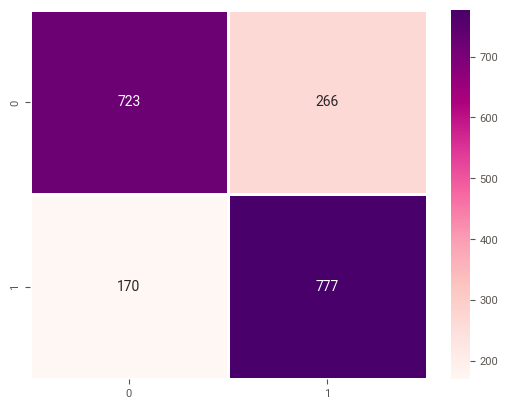

In [50]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(oslr_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.2 Decision Tree

In [51]:
# Initializing the model
dt_clf = DecisionTreeClassifier(random_state=24)
os_dt_model = dt_clf.fit(os_X_train, os_y_train)

# Feature importances
dt_importance = os_dt_model.feature_importances_
dt_importance = pd.DataFrame(dt_importance, columns=["score"]).reset_index()
dt_importance["Feature"] = list(os_X.columns)
dt_importance.drop(columns=["index"], inplace=True)

dt_importance.sort_values(by= "score",
                          ascending=False,
                          ignore_index=True,
                          inplace=True)

# Plotting the feature importances
fig = px.bar(dt_importance, x= "Feature", y= "score")
fig.show()

In [52]:
# Making predictions
oversampled_dt_pred = os_dt_model.predict(os_X_test)

# Evaluating the model
oversampled_dt_report = classification_report(os_y_test, oversampled_dt_pred)
print(oversampled_dt_report)

              precision    recall  f1-score   support

           0       0.85      0.79      0.82       989
           1       0.79      0.85      0.82       947

    accuracy                           0.82      1936
   macro avg       0.82      0.82      0.82      1936
weighted avg       0.82      0.82      0.82      1936



In [53]:
# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, oversampled_dt_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.80465


In [54]:
# Defining the Confusion Matrix
os_dt_conf_mat = confusion_matrix(os_y_test, oversampled_dt_pred)
os_dt_conf_mat = pd.DataFrame(os_dt_conf_mat).reset_index(drop=True)
os_dt_conf_mat

,0,1
0,778,211
1,138,809


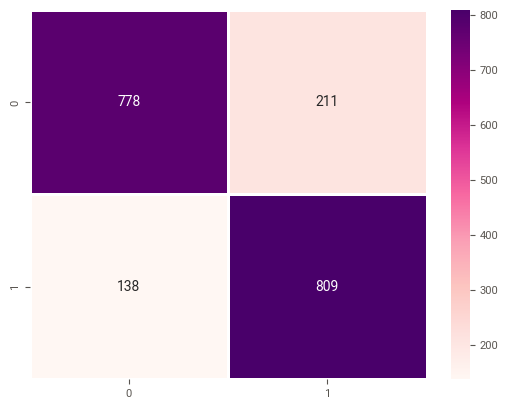

In [55]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(os_dt_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.3 Random Forest

In [56]:
# Random Forests
rf_clf = RandomForestClassifier(random_state=24)
os_rf_model = rf_clf.fit(os_X_train, os_y_train)

# Feature Importance of the Random Forest Model
rf_importance = os_rf_model.feature_importances_
rf_importance = pd.DataFrame(rf_importance, columns=["score"]).reset_index()
rf_importance["Feature"] = list(os_X.columns)
rf_importance.drop(columns=["index"], inplace=True)
rf_importance.sort_values(by="score",
                          ascending=False,
                          ignore_index=True,
                          inplace=True)

# Visualizing the feature importances
fig = px.bar(rf_importance, x="Feature", y="score")
fig.show()

In [57]:
# Making predictions
oversampled_rf_pred = os_rf_model.predict(os_X_test)

# Evaluating the model
oversampled_rf_report = classification_report(os_y_test, oversampled_rf_pred)
print(oversampled_rf_report)

              precision    recall  f1-score   support

           0       0.94      0.84      0.89       989
           1       0.85      0.95      0.90       947

    accuracy                           0.89      1936
   macro avg       0.90      0.89      0.89      1936
weighted avg       0.90      0.89      0.89      1936



In [58]:
# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, oversampled_rf_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.87011


In [59]:
# Defining the Confusion Matrix
os_rf_conf_mat = confusion_matrix(os_y_test, oversampled_rf_pred)
os_rf_conf_mat = pd.DataFrame(os_rf_conf_mat).reset_index(drop=True)
os_rf_conf_mat

,0,1
0,835,154
1,52,895


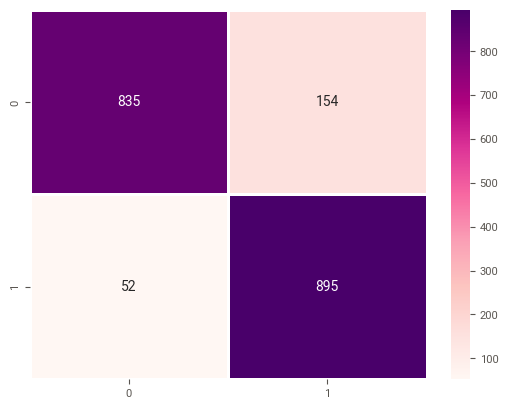

In [60]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(os_rf_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.4 XGBoost

In [61]:
# Fitting model to the training data
xgb_clf = XGBClassifier(random_state=24)
os_xgb_model = xgb_clf.fit(os_X_train, os_y_train)

# Feature Importance of the Random Forest Model
xgb_importance = os_xgb_model.feature_importances_
xgb_importance = pd.DataFrame(xgb_importance, columns=["score"]).reset_index()
xgb_importance["Feature"] = list(os_X.columns)
xgb_importance.drop(columns=["index"], inplace=True)
xgb_importance.sort_values(by="score",
                           ascending=False,
                           ignore_index=True,
                           inplace=True)

# Visualizing the feature importances
fig = px.bar(xgb_importance, x="Feature", y="score")
fig.show()

In [62]:
# Making predictions
oversampled_xgb_pred = os_xgb_model.predict(os_X_test)

# Evaluating the model
oversampled_xgb_report = classification_report(os_y_test, oversampled_xgb_pred)
print(oversampled_xgb_report)

              precision    recall  f1-score   support

           0       0.88      0.81      0.84       989
           1       0.82      0.89      0.85       947

    accuracy                           0.85      1936
   macro avg       0.85      0.85      0.85      1936
weighted avg       0.85      0.85      0.85      1936



In [63]:
# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, oversampled_xgb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.82987


In [64]:
# Defining the Confusion Matrix
os_xgb_conf_mat = confusion_matrix(os_y_test, oversampled_xgb_pred)
os_xgb_conf_mat = pd.DataFrame(os_xgb_conf_mat).reset_index(drop=True)
os_xgb_conf_mat

,0,1
0,801,188
1,108,839


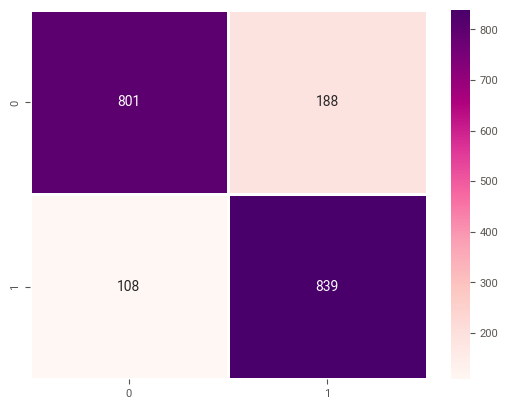

In [65]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(os_xgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.5 CatBoost

In [66]:
# Initializing CatBoostClassifier
oversampled_catb_clf = CatBoostClassifier(metric_period=100, random_state=24)

# Fitting it to the training data
oversampled_catb_model = oversampled_catb_clf.fit(os_X_train, os_y_train)

# Feature Importance of the Model
oversampled_catb_importance = oversampled_catb_model.feature_importances_

oversampled_catb_importance = pd.DataFrame(oversampled_catb_importance,
                                           columns=["score"]).reset_index()

oversampled_catb_importance["Feature"] = list(os_X.columns)

oversampled_catb_importance.drop(columns=["index"], inplace=True)

oversampled_catb_importance.sort_values(by="score",
                                        ascending=False,
                                        ignore_index=True,
                                        inplace=True)

fig = px.bar(oversampled_catb_importance, x="Feature", y="score")
fig.show()

Learning rate set to 0.021836
0:	learn: 0.6832587	total: 141ms	remaining: 2m 21s
100:	learn: 0.4571652	total: 530ms	remaining: 4.72s
200:	learn: 0.4217273	total: 921ms	remaining: 3.66s
300:	learn: 0.3983301	total: 1.32s	remaining: 3.06s
400:	learn: 0.3769780	total: 1.71s	remaining: 2.55s
500:	learn: 0.3577619	total: 2.1s	remaining: 2.1s
600:	learn: 0.3406406	total: 2.5s	remaining: 1.66s
700:	learn: 0.3253422	total: 2.9s	remaining: 1.24s
800:	learn: 0.3110418	total: 3.32s	remaining: 826ms
900:	learn: 0.2982096	total: 3.72s	remaining: 409ms
999:	learn: 0.2870598	total: 4.11s	remaining: 0us


In [67]:
# Making the predictions
oversampled_catb_pred = oversampled_catb_model.predict(os_X_test)

# Evaluating the model
oversampled_catb_report = classification_report(os_y_test,
                                                oversampled_catb_pred,
                                                target_names=["Stayed", "Churned"])
print(oversampled_catb_report)

              precision    recall  f1-score   support

      Stayed       0.86      0.78      0.82       989
     Churned       0.79      0.87      0.83       947

    accuracy                           0.82      1936
   macro avg       0.83      0.83      0.82      1936
weighted avg       0.83      0.82      0.82      1936



In [68]:
# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, oversampled_catb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.80725


In [69]:
# Defining the Confusion Matrix
os_catb_conf_mat = confusion_matrix(os_y_test, oversampled_catb_pred)
os_catb_conf_mat = pd.DataFrame(os_catb_conf_mat).reset_index(drop=True)
os_catb_conf_mat

,0,1
0,776,213
1,127,820


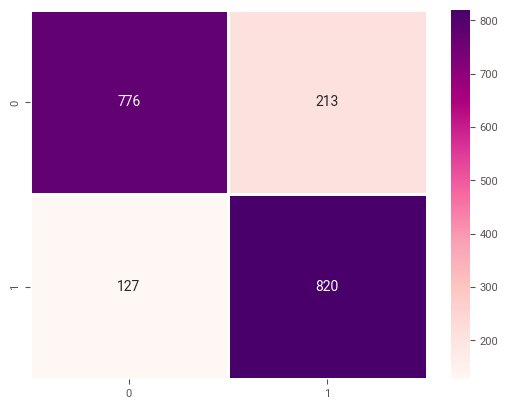

In [70]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(os_catb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax
            )
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.6 LightGBM

In [71]:
# Initializing LightGBM Classifier
oversampled_lgb_clf = lgb.LGBMClassifier(random_state=24)

# Fitting it to the training data
oversampled_lgb_model = oversampled_lgb_clf.fit(os_X_train, os_y_train)

# Feature Importance of the Model
oversampled_lgb_importance = oversampled_lgb_model.feature_importances_

oversampled_lgb_importance = pd.DataFrame(oversampled_lgb_importance,
                                          columns=["score"]).reset_index()

oversampled_lgb_importance["Feature"] = list(os_X.columns)
oversampled_lgb_importance.drop(columns=["index"], inplace=True)
oversampled_lgb_importance.sort_values(by="score",
                                       ascending=False,
                                       ignore_index=True,
                                       inplace=True
                                       )

fig = px.bar(oversampled_lgb_importance, x="Feature", y="score")
fig.show()

In [72]:
# Making the predictions
oversampled_lgb_pred = oversampled_lgb_model.predict(os_X_test)

# Evaluating the model
oversampled_lgb_report = classification_report(
    os_y_test, oversampled_lgb_pred, target_names=["Stayed", "Churned"])
print(oversampled_lgb_report)

              precision    recall  f1-score   support

      Stayed       0.86      0.79      0.82       989
     Churned       0.79      0.87      0.83       947

    accuracy                           0.83      1936
   macro avg       0.83      0.83      0.83      1936
weighted avg       0.83      0.83      0.83      1936



In [73]:
# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, oversampled_lgb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.80858


In [74]:
# Defining the Confusion Matrix
os_lgb_conf_mat = confusion_matrix(os_y_test, oversampled_lgb_pred)
os_lgb_conf_mat = pd.DataFrame(os_lgb_conf_mat).reset_index(drop=True)
os_lgb_conf_mat

,0,1
0,777,212
1,125,822


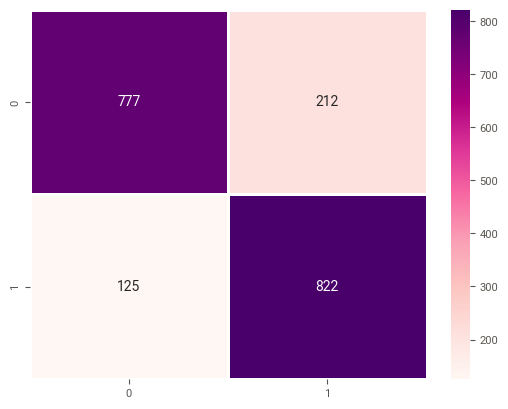

In [75]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(os_lgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.7 Summarizing the Performance of the Models

In [76]:
oversampling_models = {
    "os_lr": os_log_reg_model,
    "os_dt": os_dt_model,
    "os_rf": os_rf_model,
    "os_xgb": os_xgb_model,
    "os_catb": oversampled_catb_model,
    "os_lgb": oversampled_lgb_model
}

In [77]:
# Defining a helper function to evaluate the models at a go
def evaluation(fit_models, X_test, y_test):
    lst = []
    for name, model in fit_models.items():
        pred = model.predict(X_test)

        f2_score = fbeta_score(y_test, pred, beta=0.5)
        f2_score = "{:.5f}".format(f2_score)

        lst.append([
            name,
            precision_score(y_test, pred, average="weighted"),
            recall_score(y_test, pred, average="weighted"),
            f1_score(y_test, pred, average="weighted"),
            accuracy_score(y_test, pred),
            f2_score
        ])

    eval_df = pd.DataFrame(lst, columns=[
                           "model", "precision", "recall", "f1_weighted", "accuracy", "f2_score"])
    eval_df.set_index("model", inplace=True)
    return eval_df

In [78]:
oversampled_models_eval = evaluation(oversampling_models, os_X_test, os_y_test)
oversampled_models_eval

,precision,recall,f1_weighted,accuracy,f2_score
model,,,,,
os_lr,0.778000,0.774793,0.774482,0.774793,0.75894
os_dt,0.821851,0.819731,0.819623,0.819731,0.80465
os_rf,0.898241,0.893595,0.893421,0.893595,0.87011
os_xgb,0.849762,0.847107,0.846983,0.847107,0.82987
os_catb,0.827292,0.824380,0.824203,0.824380,0.80725
os_lgb,0.828916,0.825930,0.825748,0.825930,0.80858


### 6.2 Undersampling

In [79]:
# One more look at the training data
train_data.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,gender_Male,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn
4003,0,0,0,38,1,0,20.30,743.05,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,1,0
3732,0,1,1,23,1,1,77.15,1759.40,0,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0
3251,1,0,0,37,1,1,106.75,4056.75,0,0,1,1,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1
260,1,0,0,3,0,1,41.15,132.20,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1
4385,0,0,0,21,1,1,20.35,422.70,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0


In [80]:
# Undersampling the churned class and combining the "balanced" DataFrame
churn_undersampled = not_churned.sample(count_churned)
df_undersampled = pd.concat([churn_undersampled, churned])

print('Random under-sampling:')
print(df_undersampled["Churn"].value_counts())

Random under-sampling:
0    1402
1    1402
Name: Churn, dtype: int64


In [81]:
# Defining the target & predictor variables
X = df_undersampled.drop(columns=["Churn"])
y = df_undersampled["Churn"]

# Splitting the dataframe
us_X_train, us_X_test, us_y_train, us_y_test = train_test_split(X, y, test_size=0.25, random_state=24)

In [82]:
# Scaling the numeric columns
scaler = MinMaxScaler()

us_X_train[columns_to_scale] = scaler.fit_transform(us_X_train[columns_to_scale])
us_X_test[columns_to_scale] = scaler.fit_transform(us_X_test[columns_to_scale])

#### 6.2.1 Logistic Regression

In [83]:
# Logistic Regression
log_reg = LogisticRegression()
us_log_reg_model = log_reg.fit(us_X_train, us_y_train)

# Feature Importance of the Random Forest Model
us_log_reg_importance = us_log_reg_model.coef_[0]
us_log_reg_importance = pd.DataFrame(us_log_reg_importance, index=X.columns)
us_log_reg_importance.reset_index(inplace=True)
us_log_reg_importance.rename(columns={
    "index": "Feature",
    0: "Score"
},
    inplace=True)
us_log_reg_importance.sort_values(by="Score", ascending=False, inplace=True)
us_log_reg_importance

fig = px.bar(us_log_reg_importance, x="Feature", y="Score")
fig.show()

In [84]:
# Making predictions
us_log_reg_pred = us_log_reg_model.predict(us_X_test)

# Evaluating the model
us_log_reg_report = classification_report(us_y_test, us_log_reg_pred)
print(us_log_reg_report)

              precision    recall  f1-score   support

           0       0.79      0.73      0.76       362
           1       0.73      0.79      0.76       339

    accuracy                           0.76       701
   macro avg       0.76      0.76      0.76       701
weighted avg       0.76      0.76      0.76       701



In [85]:
# Calculating the F2 Score
f2_score = fbeta_score(us_y_test, us_log_reg_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.74268


In [86]:
# Defining the Confusion Matrix
us_lr_conf_mat = confusion_matrix(us_y_test, us_log_reg_pred)
us_lr_conf_mat = pd.DataFrame(us_lr_conf_mat).reset_index(drop=True)
us_lr_conf_mat

,0,1
0,263,99
1,70,269


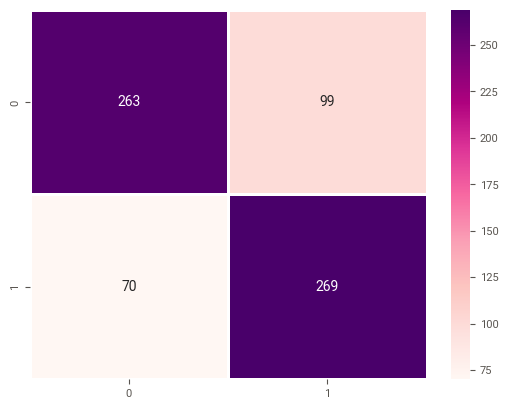

In [87]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(us_lr_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.2.2 Decision Tree

In [88]:
# Decision Tree
dt_clf = DecisionTreeClassifier(random_state=24)
us_dt_model = dt_clf.fit(us_X_train, us_y_train)

# Feature importances
us_dt_importance = us_dt_model.feature_importances_
us_dt_importance = pd.DataFrame(us_dt_importance,
                                columns=["score"]).reset_index()
us_dt_importance["Feature"] = list(X.columns)
us_dt_importance.drop(columns=["index"], inplace=True)
us_dt_importance.sort_values(by="score",
                             ascending=False,
                             ignore_index=True,
                             inplace=True)

# Plotting the feature importances
fig = px.bar(us_dt_importance, x="Feature", y="score")
fig.show()

In [89]:
# Making predictions
us_dt_pred = us_dt_model.predict(us_X_test)

# Evaluating the model
us_dt_report = classification_report(us_y_test, us_dt_pred)
print(us_dt_report)

              precision    recall  f1-score   support

           0       0.71      0.69      0.70       362
           1       0.67      0.70      0.69       339

    accuracy                           0.69       701
   macro avg       0.69      0.69      0.69       701
weighted avg       0.69      0.69      0.69       701



In [90]:
# Calculating the F2 Score
f2_score = fbeta_score(us_y_test, us_dt_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.67855


In [91]:
# Defining the Confusion Matrix
us_dt_conf_mat = confusion_matrix(us_y_test, us_dt_pred)
us_dt_conf_mat = pd.DataFrame(us_dt_conf_mat).reset_index(drop=True)
us_dt_conf_mat

,0,1
0,248,114
1,103,236


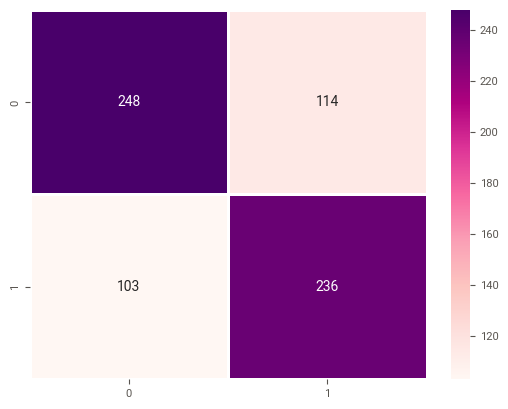

In [92]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(us_dt_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.2.3 Random Forest

In [93]:
# Random Forests
rf_clf = RandomForestClassifier(random_state=24)
us_rf_model = rf_clf.fit(us_X_train, us_y_train)

# Feature Importance of the Random Forest Model
us_rf_importance = us_rf_model.feature_importances_
us_rf_importance = pd.DataFrame(us_rf_importance,
                                columns=["score"]).reset_index()

us_rf_importance["Feature"] = list(X.columns)
us_rf_importance.drop(columns=["index"], inplace=True)

us_rf_importance.sort_values(by="score",
                             ascending=False,
                             ignore_index=True,
                             inplace=True)

fig = px.bar(us_rf_importance, x="Feature", y="score")
fig.show()

In [94]:
# Making predictions
us_rf_pred = us_rf_model.predict(us_X_test)

# Evaluating the model
us_rf_report = classification_report(us_y_test, us_rf_pred)
print(us_rf_report)

              precision    recall  f1-score   support

           0       0.80      0.74      0.77       362
           1       0.74      0.80      0.77       339

    accuracy                           0.77       701
   macro avg       0.77      0.77      0.77       701
weighted avg       0.77      0.77      0.77       701



In [95]:
# Calculating the F2 Score
f2_score = fbeta_score(us_y_test, us_rf_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.75430


In [96]:
# Defining the Confusion Matrix
us_rf_conf_mat = confusion_matrix(us_y_test, us_rf_pred)
us_rf_conf_mat = pd.DataFrame(us_rf_conf_mat).reset_index(drop=True)
us_rf_conf_mat

,0,1
0,268,94
1,67,272


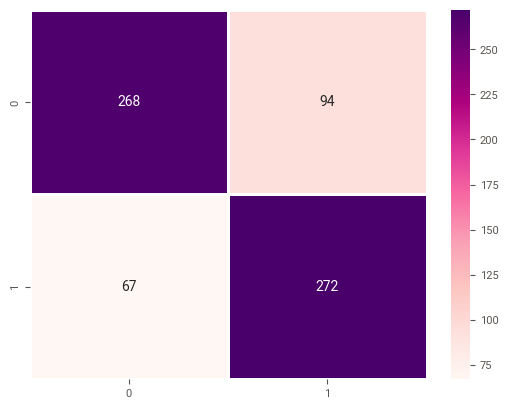

In [97]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(us_rf_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.2.4 XGBoost

In [98]:
# fitting model to the training data
xgb_clf = XGBClassifier(random_state=24)
us_xgb_model = xgb_clf.fit(us_X_train, us_y_train)

# Feature Importance of the Random Forest Model
us_xgb_importance = us_xgb_model.feature_importances_
us_xgb_importance = pd.DataFrame(us_xgb_importance,
                                 columns=["score"]).reset_index()

us_xgb_importance["Feature"] = list(X.columns)

us_xgb_importance.drop(columns=["index"], inplace=True)

us_xgb_importance.sort_values(by="score",
                              ascending=False,
                              ignore_index=True,
                              inplace=True)

fig = px.bar(us_xgb_importance, x="Feature", y="score")
fig.show()

In [99]:
# Making the predictions
us_xgb_pred = us_xgb_model.predict(us_X_test)

# Evaluating the model
us_xgb_report = classification_report(us_y_test, us_xgb_pred)
print(us_xgb_report)

              precision    recall  f1-score   support

           0       0.80      0.72      0.76       362
           1       0.73      0.81      0.77       339

    accuracy                           0.76       701
   macro avg       0.77      0.76      0.76       701
weighted avg       0.77      0.76      0.76       701



In [100]:
# Calculating the F2 Score
f2_score = fbeta_score(us_y_test, us_xgb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.74549


In [101]:
# Defining the Confusion Matrix
us_xgb_conf_mat = confusion_matrix(us_y_test, us_xgb_pred)
us_xgb_conf_mat = pd.DataFrame(us_xgb_conf_mat).reset_index(drop=True)
us_xgb_conf_mat

,0,1
0,262,100
1,66,273


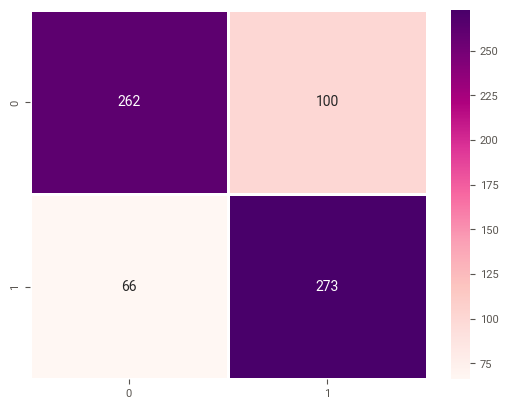

In [102]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(us_xgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.2.5 CatBoost

In [103]:
# Initializing CatBoostClassifier
us_catb_clf = CatBoostClassifier(metric_period=100, random_state=24)

# Fitting it to the training data
us_catb_model = us_catb_clf.fit(us_X_train, us_y_train)

# Feature Importance of the Model
us_catb_importance = us_catb_model.feature_importances_
us_catb_importance = pd.DataFrame(us_catb_importance,
                                  columns=["score"]).reset_index()
us_catb_importance["Feature"] = list(X.columns)
us_catb_importance.drop(columns=["index"], inplace=True)
us_catb_importance.sort_values(by="score",
                               ascending=False,
                               ignore_index=True,
                               inplace=True)

fig = px.bar(us_catb_importance, x="Feature", y="score")
fig.show()

Learning rate set to 0.014151
0:	learn: 0.6869070	total: 3.32ms	remaining: 3.31s
100:	learn: 0.4789032	total: 331ms	remaining: 2.95s
200:	learn: 0.4391517	total: 691ms	remaining: 2.75s
300:	learn: 0.4151758	total: 1.05s	remaining: 2.43s
400:	learn: 0.3959550	total: 1.36s	remaining: 2.04s
500:	learn: 0.3793470	total: 1.71s	remaining: 1.7s
600:	learn: 0.3628422	total: 2.05s	remaining: 1.36s
700:	learn: 0.3470392	total: 2.41s	remaining: 1.03s
800:	learn: 0.3339120	total: 2.71s	remaining: 675ms
900:	learn: 0.3219646	total: 3.07s	remaining: 337ms
999:	learn: 0.3098393	total: 3.42s	remaining: 0us


In [104]:
# Making the predictions
us_catb_pred = us_catb_model.predict(us_X_test)

# Evaluating the model
us_catb_report = classification_report(
    us_y_test, us_catb_pred, target_names=["Stayed", "Churned"])
print(us_catb_report)

              precision    recall  f1-score   support

      Stayed       0.80      0.72      0.76       362
     Churned       0.73      0.81      0.77       339

    accuracy                           0.76       701
   macro avg       0.76      0.76      0.76       701
weighted avg       0.76      0.76      0.76       701



In [105]:
# Calculating the F2 Score
f2_score = fbeta_score(us_y_test, us_catb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.74174


In [106]:
# Defining the Confusion Matrix
us_catb_conf_mat = confusion_matrix(us_y_test, us_catb_pred)
us_catb_conf_mat = pd.DataFrame(us_catb_conf_mat).reset_index(drop=True)
us_catb_conf_mat

,0,1
0,259,103
1,65,274


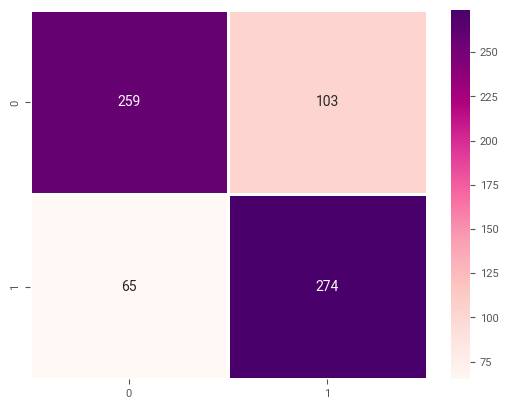

In [107]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(us_catb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.2.6 LightGBM

In [108]:
# Initializing LightGBM Classifier
us_lgb_clf = lgb.LGBMClassifier(random_state=24)

# Fitting it to the training data
us_lgb_model = us_lgb_clf.fit(us_X_train, us_y_train)

# Feature Importance of the Model
us_lgb_importance = us_lgb_model.feature_importances_
us_lgb_importance = pd.DataFrame(us_lgb_importance,
                                 columns=["score"]).reset_index()
us_lgb_importance["Feature"] = list(X.columns)
us_lgb_importance.drop(columns=["index"], inplace=True)
us_lgb_importance.sort_values(by="score",
                              ascending=False,
                              ignore_index=True,
                              inplace=True)

fig = px.bar(us_lgb_importance, x="Feature", y="score")
fig.show()

In [109]:
# Making the predictions
us_lgb_pred = us_lgb_model.predict(us_X_test)

# Evaluating the model
us_lgb_report = classification_report(
    us_y_test, us_lgb_pred, target_names=["Stayed", "Churned"])
print(us_lgb_report)

              precision    recall  f1-score   support

      Stayed       0.79      0.74      0.77       362
     Churned       0.74      0.80      0.77       339

    accuracy                           0.77       701
   macro avg       0.77      0.77      0.77       701
weighted avg       0.77      0.77      0.77       701



In [110]:
# Calculating the F2 Score
f2_score = fbeta_score(us_y_test, us_lgb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.75042


In [111]:
# Defining the Confusion Matrix
us_lgb_conf_mat = confusion_matrix(us_y_test, us_lgb_pred)
us_lgb_conf_mat = pd.DataFrame(us_lgb_conf_mat).reset_index(drop=True)
us_lgb_conf_mat

,0,1
0,267,95
1,69,270


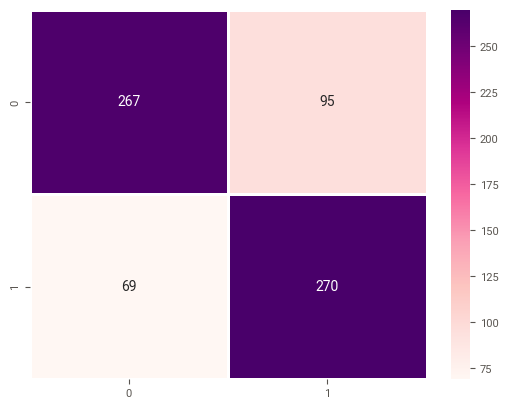

In [112]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(us_lgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.1.7 Summarizing the Performance of the Models

In [113]:
undersampling_models = {
    "us_lr": us_log_reg_model,
    "us_dt": us_dt_model,
    "us_rf": us_rf_model,
    "us_xgb": us_xgb_model,
    "us_catb": us_catb_model,
    "us_lgb": us_lgb_model
}

In [114]:
undersampled_models_eval = evaluation(undersampling_models, us_X_test, us_y_test)
undersampled_models_eval

,precision,recall,f1_weighted,accuracy,f2_score
model,,,,,
us_lr,0.761349,0.758916,0.758830,0.758916,0.74268
us_dt,0.690949,0.690442,0.690525,0.690442,0.67855
us_rf,0.772517,0.770328,0.770278,0.770328,0.75430
us_xgb,0.766439,0.763195,0.763015,0.763195,0.74549
us_catb,0.764277,0.760342,0.760064,0.760342,0.74174
us_lgb,0.768085,0.766049,0.766011,0.766049,0.75042


### 6.3 SMOTE

In [115]:
# Creating a copy of the the training dataframe for the SMOTE
smote_data = train_data.copy()
X = smote_data.drop(columns=["Churn"])
y = smote_data["Churn"]

In [116]:
# Resampling the dataframe using SMOTE
smote = SMOTE(sampling_strategy= "minority")
X_sm, y_sm = smote.fit_resample(X, y)
y_sm.value_counts()

0    3872
1    3872
Name: Churn, dtype: int64

In [117]:
# Splitting the dataframe
sm_X_train, sm_X_test, sm_y_train, sm_y_test = train_test_split(X_sm, y_sm, test_size= 0.25, random_state= 24, stratify=y_sm)
sm_y_train.value_counts()

1    2904
0    2904
Name: Churn, dtype: int64

In [118]:
# Scaling the numeric columns
scaler = MinMaxScaler()

sm_X_train[columns_to_scale] = scaler.fit_transform(sm_X_train[columns_to_scale])
sm_X_test[columns_to_scale] = scaler.fit_transform(sm_X_test[columns_to_scale])

#### 6.3.1 Logistic Regression

In [119]:
# Logistic Regression
log_reg = LogisticRegression(random_state=24)
sm_log_reg_model = log_reg.fit(sm_X_train, sm_y_train)

# Feature Importance of the Random Forest Model
sm_log_reg_importance = sm_log_reg_model.coef_[0]
sm_log_reg_importance = pd.DataFrame(sm_log_reg_importance, index=X.columns)
sm_log_reg_importance.reset_index(inplace=True)
sm_log_reg_importance.rename(columns={
    "index": "Feature",
    0: "Score"
},
    inplace=True)
sm_log_reg_importance.sort_values(by="Score", ascending=False, inplace=True)
sm_log_reg_importance

fig = px.bar(sm_log_reg_importance, x="Feature", y="Score")
fig.show()

In [120]:
# Making predictions
sm_log_reg_pred = sm_log_reg_model.predict(sm_X_test)

# Evaluating the predictions
sm_log_reg_report = classification_report(sm_y_test, sm_log_reg_pred)
print(sm_log_reg_report)

              precision    recall  f1-score   support

           0       0.84      0.80      0.82       968
           1       0.81      0.85      0.83       968

    accuracy                           0.83      1936
   macro avg       0.83      0.83      0.83      1936
weighted avg       0.83      0.83      0.83      1936



In [121]:
# Calculating the F2 Score
f2_score = fbeta_score(sm_y_test, sm_log_reg_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.81845


In [122]:
# Defining the Confusion Matrix
sm_log_reg_conf_mat = confusion_matrix(sm_y_test, sm_log_reg_pred)
sm_log_reg_conf_mat = pd.DataFrame(sm_log_reg_conf_mat).reset_index(drop=True)
sm_log_reg_conf_mat

,0,1
0,775,193
1,143,825


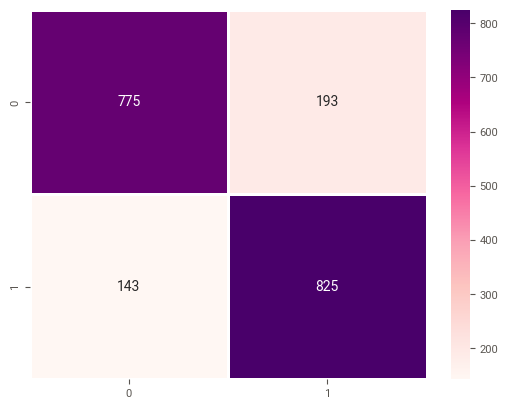

In [123]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(sm_log_reg_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.2 Decision Tree

In [124]:
# Decision Tree
dt_clf = DecisionTreeClassifier(random_state=24)
sm_dt_model = dt_clf.fit(sm_X_train, sm_y_train)

# Feature importances
sm_dt_importance = sm_dt_model.feature_importances_
sm_dt_importance = pd.DataFrame(sm_dt_importance,
                                columns=["score"]).reset_index()
sm_dt_importance["Feature"] = list(X.columns)
sm_dt_importance.drop(columns=["index"], inplace=True)
sm_dt_importance.sort_values(by="score",
                             ascending=False,
                             ignore_index=True,
                             inplace=True)

# Plotting the feature importances
fig = px.bar(sm_dt_importance, x="Feature", y="score")
fig.show()

In [125]:
# Making predictions
sm_dt_pred = sm_dt_model.predict(sm_X_test)

# Evaluating the predictions
sm_dt_report = classification_report(sm_y_test, sm_dt_pred)
print(sm_dt_report)

              precision    recall  f1-score   support

           0       0.79      0.77      0.78       968
           1       0.78      0.80      0.79       968

    accuracy                           0.79      1936
   macro avg       0.79      0.79      0.79      1936
weighted avg       0.79      0.79      0.79      1936



In [126]:
# Calculating the F2 Score
f2_score = fbeta_score(sm_y_test, sm_dt_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.78302


In [127]:
# Defining the Confusion Matrix
sm_dt_conf_mat = confusion_matrix(sm_y_test, sm_dt_pred)
sm_dt_conf_mat = pd.DataFrame(sm_dt_conf_mat).reset_index(drop=True)
sm_dt_conf_mat

,0,1
0,749,219
1,195,773


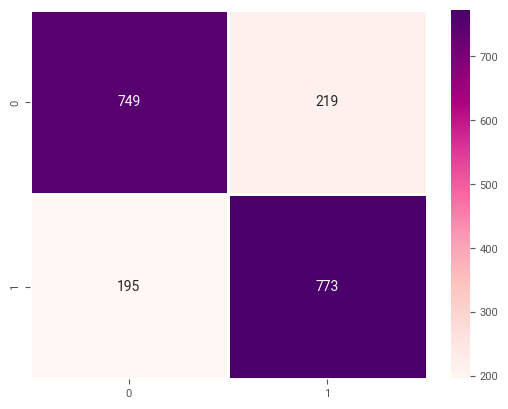

In [128]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(sm_dt_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.3 Random Forest

In [129]:
# Random Forests
rf_clf = RandomForestClassifier(random_state=24)
sm_rf_model = rf_clf.fit(sm_X_train, sm_y_train)

# Feature Importance of the Random Forest Model
sm_rf_importance = sm_rf_model.feature_importances_
sm_rf_importance = pd.DataFrame(sm_rf_importance,
                                columns=["score"]).reset_index()
sm_rf_importance["Feature"] = list(X.columns)
sm_rf_importance.drop(columns=["index"], inplace=True)
sm_rf_importance.sort_values(by="score",
                             ascending=False,
                             ignore_index=True,
                             inplace=True)

fig = px.bar(sm_rf_importance, x="Feature", y="score")
fig.show()

In [130]:
# Making predictions
sm_rf_pred = sm_rf_model.predict(sm_X_test)

sm_rf_report = classification_report(sm_y_test, sm_rf_pred)
print(sm_rf_report)

              precision    recall  f1-score   support

           0       0.85      0.85      0.85       968
           1       0.85      0.85      0.85       968

    accuracy                           0.85      1936
   macro avg       0.85      0.85      0.85      1936
weighted avg       0.85      0.85      0.85      1936



In [131]:
# Calculating the F2 Score
f2_score = fbeta_score(sm_y_test, sm_rf_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.84979


In [132]:
# Defining the Confusion Matrix
sm_rf_conf_mat = confusion_matrix(sm_y_test, sm_rf_pred)
sm_rf_conf_mat = pd.DataFrame(sm_rf_conf_mat).reset_index(drop=True)
sm_rf_conf_mat

,0,1
0,821,147
1,142,826


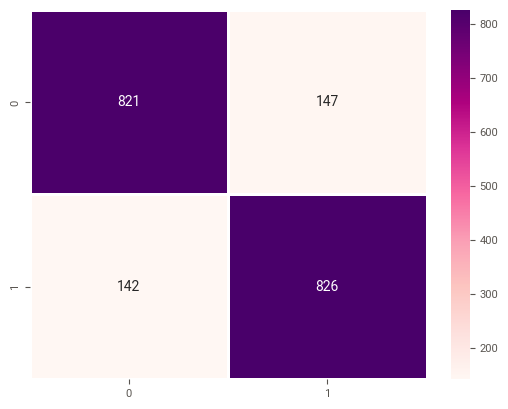

In [133]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(sm_rf_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.4 XGBoost

In [134]:
# fitting model to the training data
xgb_clf = XGBClassifier(random_state=24)
sm_xgb_model = xgb_clf.fit(sm_X_train, sm_y_train)

# Feature Importance of the Random Forest Model
sm_xgb_importance = sm_xgb_model.feature_importances_
sm_xgb_importance = pd.DataFrame(sm_xgb_importance,
                                 columns=["score"]).reset_index()
sm_xgb_importance["Feature"] = list(X.columns)
sm_xgb_importance.drop(columns=["index"], inplace=True)
sm_xgb_importance.sort_values(by="score",
                              ascending=False,
                              ignore_index=True,
                              inplace=True)

fig = px.bar(sm_xgb_importance, x="Feature", y="score")
fig.show()

In [135]:
# Making the predictions
sm_xgb_pred = sm_xgb_model.predict(sm_X_test)

# Evaluating the model
sm_xgb_report = classification_report(sm_y_test, sm_xgb_pred)
print(sm_xgb_report)

              precision    recall  f1-score   support

           0       0.85      0.85      0.85       968
           1       0.85      0.85      0.85       968

    accuracy                           0.85      1936
   macro avg       0.85      0.85      0.85      1936
weighted avg       0.85      0.85      0.85      1936



In [136]:
# Calculating the F2 Score
f2_score = fbeta_score(sm_y_test, sm_xgb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.84604


In [137]:
# Defining the Confusion Matrix
sm_xgb_conf_mat = confusion_matrix(sm_y_test, sm_xgb_pred)
sm_xgb_conf_mat = pd.DataFrame(sm_xgb_conf_mat).reset_index(drop=True)
sm_xgb_conf_mat

,0,1
0,818,150
1,147,821


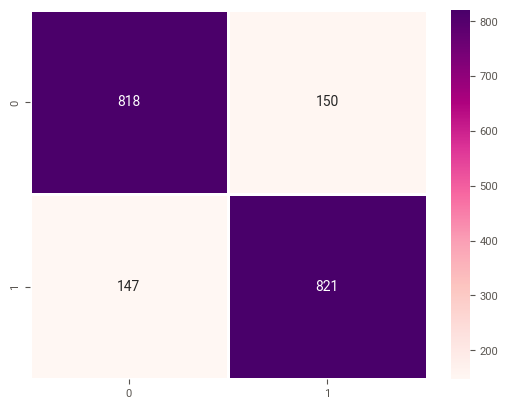

In [138]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(sm_xgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.5 CatBoost

In [139]:
# Initializing CatBoostClassifier
catb_clf = CatBoostClassifier(metric_period=100, random_state=24)

# Fitting it to the training data
sm_catb_model = catb_clf.fit(sm_X_train, sm_y_train)

# Feature Importance of the Model
sm_catb_importance = sm_catb_model.feature_importances_
sm_catb_importance = pd.DataFrame(sm_catb_importance,
                                  columns=["score"]).reset_index()

sm_catb_importance["Feature"] = list(X.columns)

sm_catb_importance.drop(columns=["index"], inplace=True)

sm_catb_importance.sort_values(by="score",
                               ascending=False,
                               ignore_index=True,
                               inplace=True)

fig = px.bar(sm_catb_importance, x="Feature", y="score")
fig.show()

Learning rate set to 0.021836
0:	learn: 0.6794450	total: 3.29ms	remaining: 3.29s
100:	learn: 0.3876430	total: 382ms	remaining: 3.4s
200:	learn: 0.3492930	total: 766ms	remaining: 3.04s
300:	learn: 0.3275659	total: 1.19s	remaining: 2.76s
400:	learn: 0.3091535	total: 1.59s	remaining: 2.38s
500:	learn: 0.2924831	total: 1.98s	remaining: 1.97s
600:	learn: 0.2778770	total: 2.35s	remaining: 1.56s
700:	learn: 0.2646041	total: 2.73s	remaining: 1.16s
800:	learn: 0.2527573	total: 3.12s	remaining: 775ms
900:	learn: 0.2419555	total: 3.5s	remaining: 385ms
999:	learn: 0.2322668	total: 3.88s	remaining: 0us


In [140]:
# Making the predictions
sm_catb_pred = sm_catb_model.predict(sm_X_test)

# Evaluating the model
sm_catb_report = classification_report(sm_y_test,
                                       sm_catb_pred,
                                       target_names=["Stayed", "Churned"])
print(sm_catb_report)

              precision    recall  f1-score   support

      Stayed       0.85      0.84      0.85       968
     Churned       0.84      0.86      0.85       968

    accuracy                           0.85      1936
   macro avg       0.85      0.85      0.85      1936
weighted avg       0.85      0.85      0.85      1936



In [141]:
# Calculating the F2 Score
f2_score = fbeta_score(sm_y_test, sm_catb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.84556


In [142]:
# Defining the Confusion Matrix
sm_catb_conf_mat = confusion_matrix(sm_y_test, sm_catb_pred)
sm_catb_conf_mat = pd.DataFrame(sm_catb_conf_mat).reset_index(drop=True)
sm_catb_conf_mat

,0,1
0,813,155
1,138,830


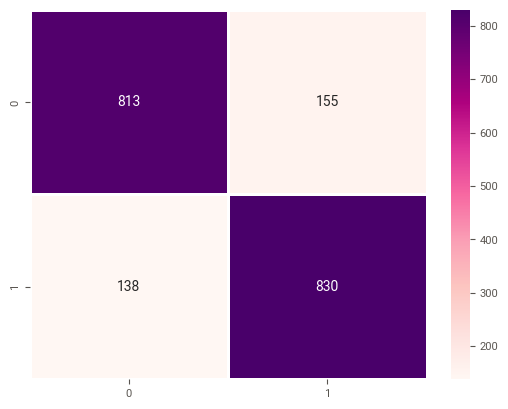

In [143]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(sm_catb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.6 LightGBM

In [144]:
# Initializing LightGBM Classifier
sm_lgb_clf = lgb.LGBMClassifier(random_state=24)

# Fitting it to the training data
sm_lgb_model = sm_lgb_clf.fit(sm_X_train, sm_y_train)

# Feature Importance of the Model
sm_lgb_importance = sm_lgb_model.feature_importances_
sm_lgb_importance = pd.DataFrame(
    sm_lgb_importance, columns=["score"]).reset_index()
sm_lgb_importance["Feature"] = list(X.columns)
sm_lgb_importance.drop(columns=["index"], inplace=True)

sm_lgb_importance.sort_values(by="score",
                              ascending=False,
                              ignore_index=True,
                              inplace=True)

fig = px.bar(sm_lgb_importance, x="Feature", y="score")
fig.show()

In [145]:
# Making the predictions
sm_lgb_pred = sm_lgb_model.predict(sm_X_test)

# Evaluating the model
sm_lgb_report = classification_report(
    sm_y_test, sm_lgb_pred, target_names=["Stayed", "Churned"])
print(sm_lgb_report)

              precision    recall  f1-score   support

      Stayed       0.86      0.84      0.85       968
     Churned       0.84      0.86      0.85       968

    accuracy                           0.85      1936
   macro avg       0.85      0.85      0.85      1936
weighted avg       0.85      0.85      0.85      1936



In [146]:
# Calculating the F2 Score
f2_score = fbeta_score(sm_y_test, sm_lgb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.84347


In [147]:
# Defining the Confusion Matrix
sm_lgb_conf_mat = confusion_matrix(sm_y_test, sm_lgb_pred)
sm_lgb_conf_mat = pd.DataFrame(sm_lgb_conf_mat).reset_index(drop=True)
sm_lgb_conf_mat

,0,1
0,809,159
1,136,832


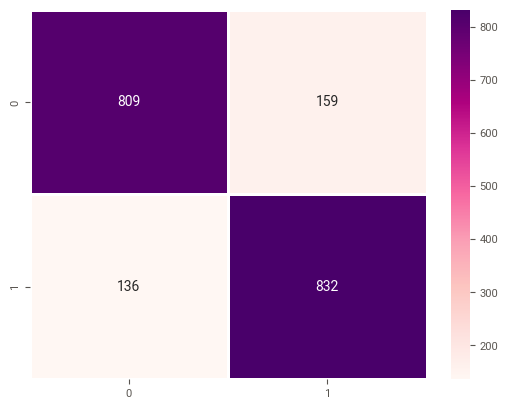

In [148]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(sm_lgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.3.7 Summarizing the Performance of the Models

In [149]:
smote_models = {
    "sm_lr": sm_log_reg_model,
    "sm_dt": sm_dt_model,
    "sm_rf": sm_rf_model,
    "sm_xgb": sm_xgb_model,
    "sm_catb": sm_catb_model,
    "sm_lgb": sm_lgb_model
}

In [150]:
smote_models_eval = evaluation(smote_models, sm_X_test, sm_y_test)
smote_models_eval

,precision,recall,f1_weighted,accuracy,f2_score
model,,,,,
sm_lr,0.827320,0.826446,0.826330,0.826446,0.81845
sm_dt,0.786333,0.786157,0.786124,0.786157,0.78302
sm_rf,0.850732,0.850723,0.850722,0.850723,0.84979
sm_xgb,0.846594,0.846591,0.846591,0.846591,0.84604
sm_catb,0.848765,0.848657,0.848645,0.848657,0.84556
sm_lgb,0.847820,0.847624,0.847602,0.847624,0.84347


### 6.4 Standalone tree-based models

In [151]:
# Defining the target & predictor variables
st_X = train_data.drop(columns=["Churn"])
st_y = train_data["Churn"]

# Splitting the dataframe into train and test
st_X_train, st_X_test, st_y_train, st_y_test = train_test_split(st_X, st_y, test_size=0.25, random_state=24, stratify=st_y)

In [152]:
# Scaling the numeric columns
scaler = MinMaxScaler()

st_X_train[columns_to_scale] = scaler.fit_transform(st_X_train[columns_to_scale])
st_X_test[columns_to_scale] = scaler.fit_transform(st_X_test[columns_to_scale])

#### 6.4.1 Decision Tree

In [153]:
# Decision Tree
dt_clf = DecisionTreeClassifier(random_state=24)
dt_model = dt_clf.fit(st_X_train, st_y_train)

# Feature importances
dt_importance = dt_model.feature_importances_
dt_importance = pd.DataFrame(dt_importance, columns=["score"]).reset_index()
dt_importance["Feature"] = list(st_X.columns)
dt_importance.drop(columns=["index"], inplace=True)

dt_importance.sort_values(by="score",
                          ascending=False,
                          ignore_index=True,
                          inplace=True)

# Plotting the feature importances
fig = px.bar(dt_importance, x="Feature", y="score")
fig.show()

In [154]:
# Making predictions
dt_pred = dt_model.predict(st_X_test)

# Evaluating the model
dt_report = classification_report(
    st_y_test, dt_pred, target_names=["Stayed", "Churned"])
print(dt_report)

              precision    recall  f1-score   support

      Stayed       0.81      0.79      0.80       968
     Churned       0.46      0.50      0.48       351

    accuracy                           0.71      1319
   macro avg       0.64      0.64      0.64      1319
weighted avg       0.72      0.71      0.71      1319



In [155]:
# Calculating the F2 Score
f2_score = fbeta_score(st_y_test, dt_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.46667


In [156]:
# Defining the Confusion Matrix
dt_conf_mat = confusion_matrix(st_y_test, dt_pred)
dt_conf_mat = pd.DataFrame(dt_conf_mat).reset_index(drop=True)
dt_conf_mat

,0,1
0,762,206
1,176,175


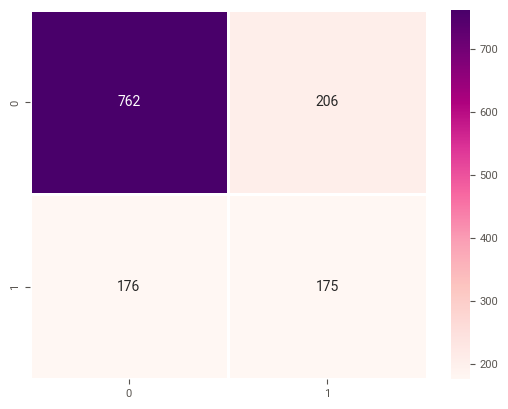

In [157]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(dt_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.4.2 Random Forest

In [158]:
# Random Forests
rf_clf = RandomForestClassifier(random_state=24)
rf_model = rf_clf.fit(st_X_train, st_y_train)

# Feature Importance of the Random Forest Model
rf_importance = rf_model.feature_importances_
rf_importance = pd.DataFrame(rf_importance, columns=["score"]).reset_index()
rf_importance["Feature"] = list(st_X.columns)
rf_importance.drop(columns=["index"], inplace=True)

rf_importance.sort_values(by="score",
                          ascending=False,
                          ignore_index=True,
                          inplace=True)

# Visualizing the feature importances
fig = px.bar(rf_importance, x="Feature", y="score")
fig.show()

In [159]:
# Making predictions
rf_pred = rf_model.predict(st_X_test)

# Evaluating the model
rf_report = classification_report(
    st_y_test, rf_pred, target_names=["Stayed", "Churned"])
print(rf_report)

              precision    recall  f1-score   support

      Stayed       0.83      0.91      0.87       968
     Churned       0.66      0.47      0.55       351

    accuracy                           0.80      1319
   macro avg       0.75      0.69      0.71      1319
weighted avg       0.78      0.80      0.78      1319



In [160]:
# Calculating the F2 Score
f2_score = fbeta_score(st_y_test, rf_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

F2 Score: 0.61436


In [161]:
# Confusion Matrix
rf_conf_mat = confusion_matrix(st_y_test, rf_pred)
rf_conf_mat = (pd.DataFrame(rf_conf_mat).reset_index(drop=True)).rename(
    columns={0: "Stayed", 1: "Churned"
            })
rf_conf_mat

,Stayed,Churned
0,884,84
1,185,166


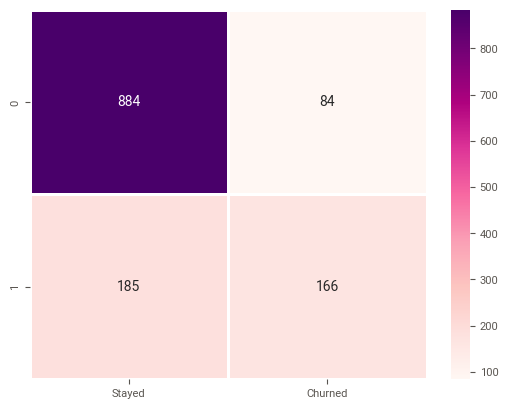

In [162]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(rf_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.xlabel = ("y_pred")
plt.ylabel = ("y_true")
plt.show()

#### 6.4.3 Summarizing the results from the standalone tree-based models

In [163]:
# Defining the dictionary for the results of the standalone tree-based models
standalone_tree_models = {"dt": dt_model,
                          "rf": rf_model
                          }

In [164]:
# Putting the results of the standalone trees together
standalone_tree_models_eval = evaluation(standalone_tree_models, st_X_test,
                                         st_y_test)
standalone_tree_models_eval

,precision,recall,f1_weighted,accuracy,f2_score
model,,,,,
dt,0.718417,0.710387,0.714042,0.710387,0.46667
rf,0.783581,0.796058,0.783977,0.796058,0.61436


### 6.5 Model Selection

In [165]:
# Putting all the model summaries together for ease of selection
all_models = pd.concat([oversampled_models_eval, undersampled_models_eval,
                        smote_models_eval, standalone_tree_models_eval])

# Sorting models by F2 score, F1 score and accuracy
all_models = all_models.sort_values(by=["f2_score", "f1_weighted", "accuracy"], ascending=False)
all_models

,precision,recall,f1_weighted,accuracy,f2_score
model,,,,,
os_rf,0.898241,0.893595,0.893421,0.893595,0.87011
sm_rf,0.850732,0.850723,0.850722,0.850723,0.84979
sm_xgb,0.846594,0.846591,0.846591,0.846591,0.84604
sm_catb,0.848765,0.848657,0.848645,0.848657,0.84556
sm_lgb,0.847820,0.847624,0.847602,0.847624,0.84347
os_xgb,0.849762,0.847107,0.846983,0.847107,0.82987
sm_lr,0.827320,0.826446,0.826330,0.826446,0.81845
os_lgb,0.828916,0.825930,0.825748,0.825930,0.80858
os_catb,0.827292,0.824380,0.824203,0.824380,0.80725


**Notes on Features**

From all the models, we note some consistency in the feature importances; we note that the top 5 most important features are:
- Total Charges: increasing total charges lead to increased churn
- Two-year contracts: 2-year contracts have a negative effect on churn; that is, those with 2-year contracts churned less
- Monthly charges: increases in monthly charges lead to increased churn
- Tenure: increasing tenure lead to lower churn.
- One-year contracts: 1-year contracts have a negative effect on churn; that is, customers with 1-year contracts churned less

## 7.0 Model Optimization
### Cross-Validation and Hyperparameter tuning

From Section 6.5 above, we note that the models from oversampling and SMOTE have the highest F2 and F1 scores, with the Oversampling Random Forest model ranking highest across all 17 models followed by 3 of 6 SMOTE models in the top 5. 

The standalone tree-based models are the worst performers, leaving the models based on the undersampling method in between.

Based on the foregoing, the Random Forest will be chosen as the optimal model as it has the highest F2 score. Its F1 score is also high, implying that regardless of the weight of the precision and recall, it performs well. It will therefore be cross-validated and the hyperparameters tuned to optimize it and improve its performance.

To ensure that no room is left to chance, the SMOTE XGBoost (2nd best model) will also be optimized to serve as a backup.

### 7.1 Oversampling Random Forest

For the best model, I will try K-fold cross-validation with different folds and different estimators (trees) to find the best number of estimators to use in getting the best version of the model.

A range of 3 different folds and 10 estimators will be used for this assessment.

**Pasting the model here for ease of access**

*Oversampled Random Forest*
```python
rf_clf = RandomForestClassifier(random_state= 24)
os_rf_model = rf_clf.fit(os_X_train, os_y_train)
```

#### 7.1.1 K-Fold Cross-Validation

In [166]:
# Defining the number of folds for cross-validation and the range of estimators
cv = list(range(10, 21, 5))

# Using a loop to cross-validate with each number in the range of estimators
for c in cv:
    score = cross_val_score(estimator = os_rf_model, 
                            X = os_X_train, 
                            y = os_y_train, 
                            cv= c).mean()
    print(f"The average score after cross-validation for the model at {c} folds is:", "{0:.5}".format(score))

The average score after cross-validation for the model at 10 folds is: 0.88791
The average score after cross-validation for the model at 15 folds is: 0.89083
The average score after cross-validation for the model at 20 folds is: 0.89066


From the above, we note that generally the model performs well with an increasing number of estimators even though there is no clear pattern as results vary by the number of k-folds used for cross-validation.

As such the number of estimators will be left open tuned along with other hyperparameters to find the best version of the model. For this, the RandomizedSearchCV and GridSearchCV will be used.

#### 7.1.2 RandomizedSearch Cross-Validation

Here, the random grid is defined by specifying some options for some hyperparameters for the model.

In [167]:
# Defining the values and instantiating the grid to be used in the RandomizedSearch
n_estimators = list(range(10, 1001, 50))
random_grid = {
    "n_estimators": n_estimators,
    "max_depth": [1, 5, 10, 20, 50, 75, 100, 150, 200, 300],
    "bootstrap": [True, False],
    "criterion": ["gini", "entropy"],
    "max_features": ["sqrt", "log2", None],
    "random_state": [24]
}

In [168]:
# Running the RandomizedSearch Cross-Validation with the grid
rf_rscv = RandomizedSearchCV(estimator= os_rf_model,
                             param_distributions= random_grid,
                             n_iter= 30,
                             cv= 10,
                             random_state= 24,
                             n_jobs= -1)

# Fitting the model to the training data
rf_rscv.fit(os_X_train, os_y_train)

RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(random_state=24),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 5, 10, 20, 50, 75, 100,
                                                      150, 200, 300],
                                        'max_features': ['sqrt', 'log2', None],
                                        'n_estimators': [10, 60, 110, 160, 210,
                                                         260, 310, 360, 410,
                                                         460, 510, 560, 610,
                                                         660, 710, 760, 810,
                                                         860, 910, 960],
                                        'random_state': [24]},
                   random_state=24)

In [169]:
# Looking at the best combination of hyperparameters for the model
best_params = rf_rscv.best_params_

print("The best combination of hyperparameters for the model will be:")

for param_name in sorted(best_params.keys()):
    print(f"{param_name}: {best_params[param_name]}")

The best combination of hyperparameters for the model will be:
bootstrap: False
criterion: gini
max_depth: 20
max_features: log2
n_estimators: 510
random_state: 24


In [170]:
# Looking at the best score for the model during cross-validation
print("The mean cross-validated score of the model's best combination of hyperparameters is:",
      "{0:.5}".format(rf_rscv.best_score_))

The mean cross-validated score of the model's best combination of hyperparameters is: 0.89721


With the RandomizedSearchCV, we note a significant improvement in the score of the model. As such, we will build an "optimized" version of the model using the recommended parameters from above and assess it.

In [171]:
# Defining an optimized version of the model with the best parameters
best_rf_model_rscv = RandomForestClassifier(bootstrap= False,
                                            criterion= "gini",
                                            max_depth= 20,
                                            max_features= "log2",
                                            n_estimators= 510,
                                            random_state= 24
                                           )

In [172]:
# Fitting the model to the training data
best_rf_model_rscv = best_rf_model_rscv.fit(os_X_train, os_y_train)

# Predicting the test data
best_rf_pred = best_rf_model_rscv.predict(os_X_test)

In [173]:
# Evaluating the model
best_rf_report = classification_report(os_y_test, best_rf_pred, target_names= ["Stayed", "Churned"])
print(best_rf_report)

# Calculating the accuracy score
accuracy = accuracy_score(os_y_test, best_rf_pred)
accuracy = "{:.5f}".format(accuracy)
print("Accuracy:", accuracy)

# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, best_rf_pred, beta= 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

              precision    recall  f1-score   support

      Stayed       0.94      0.87      0.90       989
     Churned       0.88      0.94      0.91       947

    accuracy                           0.90      1936
   macro avg       0.91      0.91      0.90      1936
weighted avg       0.91      0.90      0.90      1936

Accuracy: 0.90496
F2 Score: 0.88776


In [174]:
# Confusion Matrix
best_rf_conf_mat = confusion_matrix(os_y_test, best_rf_pred)
best_rf_conf_mat = (pd.DataFrame(best_rf_conf_mat).reset_index(drop= True)).rename(columns= {0: "Stayed", 1: "Churned"})
best_rf_conf_mat

,Stayed,Churned
0,863,126
1,58,889


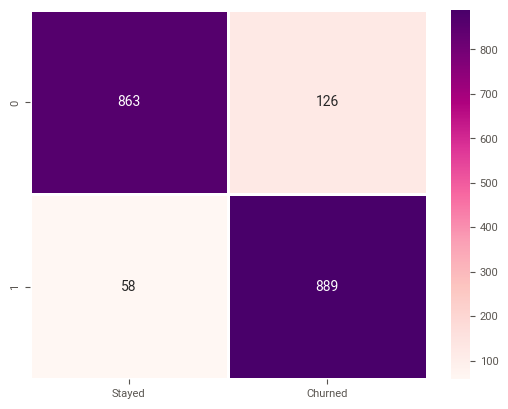

In [175]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(best_rf_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.show()

From the scores and confusion matrix above, we see that this version of the model is the best version we can have for now. With an average (cross-validated) score of about 89% and great F1-(about 90%) and F2-(about 88%) scores, we are almost certain that this model will accurately predict which customers are likely to churn and enable Vodafone take active steps to improve customer retention.

#### 7.1.3 GridSearch Cross-Validation

In [176]:
# Defining the parameter grid for the GridsearchCV
gscv_param_grid = {
    "n_estimators": [100, 200, 300, 400, 500, 600], # chosen with reference to the best estimators from the RandomizedSearchCV
    "max_features": ["sqrt", "log2"], # chosen with reference to the best estimators from the RandomizedSearchCV
    "max_depth": [10, 20, 40, 80, 160], # chosen with reference to the best estimators from the RandomizedSearchCV
    "criterion": ["gini"], # chosen with reference to the best estimators from the RandomizedSearchCV
    "random_state": [24],
    "bootstrap": [False], # chosen with reference to the best estimators from the RandomizedSearchCV
}

In [177]:
# Executing GridSearchCV
rf_gscv = GridSearchCV(estimator= os_rf_model,
                       param_grid= gscv_param_grid,
                       n_jobs= -1,
                       cv= 10
                      )

# Fitting the model to the training data
rf_gscv.fit(os_X_train, os_y_train)

GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=24),
             n_jobs=-1,
             param_grid={'bootstrap': [False], 'criterion': ['gini'],
                         'max_depth': [10, 20, 40, 80, 160],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [100, 200, 300, 400, 500, 600],
                         'random_state': [24]})

In [178]:
# Printing the best combination of hyperparameters for the model
best_params = rf_gscv.best_params_
print("The best combination of hyperparameters for the model will be:")

for param_name in sorted(best_params.keys()):
    print(f"{param_name}: {best_params[param_name]}")

The best combination of hyperparameters for the model will be:
bootstrap: False
criterion: gini
max_depth: 20
max_features: sqrt
n_estimators: 500
random_state: 24


In [179]:
# Looking at the best score for the model during cross-validation
print("The mean cross-validated score of the model's best combination of hyperparameters is:",
      "{0:.5}".format(rf_gscv.best_score_))

The mean cross-validated score of the model's best combination of hyperparameters is: 0.89893


In [183]:
# Building a new model with the best parameters
gscv_best_rf = RandomForestClassifier(random_state= 24,
                                      bootstrap = False,
                                      max_features= "sqrt",
                                      n_estimators= 500,
                                      max_depth= 20,
                                      criterion= "gini"
                                      )

In [184]:
# Fitting the optimized model to the training data
gscv_best_rf.fit(os_X_train, os_y_train)

# Predicting the test data
gscv_rf_pred = gscv_best_rf.predict(os_X_test)

In [185]:
# Evaluating the model
gscv_rf_report = classification_report(os_y_test, gscv_rf_pred, target_names= ["Stayed", "Churned"])
print(gscv_rf_report)

# Calculating the accuracy score
accuracy = accuracy_score(os_y_test, gscv_rf_pred)
accuracy = "{:.5f}".format(accuracy)
print("Accuracy:", accuracy)

# Calculating the F2 Score
f2_score = fbeta_score(os_y_test, gscv_rf_pred, beta= 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

              precision    recall  f1-score   support

      Stayed       0.93      0.87      0.90       989
     Churned       0.87      0.94      0.90       947

    accuracy                           0.90      1936
   macro avg       0.90      0.90      0.90      1936
weighted avg       0.90      0.90      0.90      1936

Accuracy: 0.90083
F2 Score: 0.88294


In [186]:
# Confusion Matrix
gscv_rf_conf_mat = confusion_matrix(os_y_test, gscv_rf_pred)
gscv_rf_conf_mat = (pd.DataFrame(gscv_rf_conf_mat).reset_index(drop=True)).rename(columns={0: "Stayed", 1: "Churned"})
gscv_rf_conf_mat

,Stayed,Churned
0,857,132
1,60,887


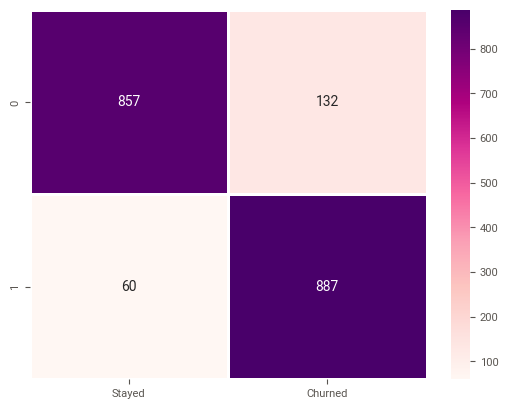

In [187]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(gscv_rf_conf_mat,
            annot= True,
            linewidth= 1.0,
            fmt= ".0f",
            cmap= "RdPu",
            ax= ax)
plt.show()

### 7.2 SMOTE XGBoost

As indicated earlier, the second best performing model will also be optimized to ensure that at the end of the day, there are at least two optimized models from which to choose. The XGBoost models will therefore be optimized with K-FOld Cross-Validation and/or RandomizedSearchCV

*Pasting the model here for ease of access*

**SMOTE XGBoost Classifier**
```python
xgb_clf = XGBClassifier(random_state= 24)
sm_xgb_model = xgb_clf.fit(sm_X_train, sm_y_train)
```

#### 7.2.1 K-Fold Cross-Validation

As was done with the Random Forest model, the XGBoost Classifier is is cross-validated using K-Fold Cross-Validation with 3 different k-values and 10 different estimators.

In [191]:
# Defining the number of folds for cross-validation and the range of estimators
cv = list(range(10, 21, 5))
n_estimators = list(range(10, 101, 10))

# Defining a loop to cross-validate with each number in the range of estimators
for c in cv:
    print(f"The model's average score after cross-validation at {c} folds is:")
    score = cross_val_score(estimator = sm_xgb_model,
                            X = sm_X_train, y = sm_y_train,
                            cv= c
                           ).mean()
    print("score_" + str(c) + "_folds:", "{0:.5}".format(score))

The model's average score after cross-validation at 10 folds is:
score_10_folds: 0.8428
The model's average score after cross-validation at 15 folds is:
score_15_folds: 0.84659
The model's average score after cross-validation at 20 folds is:
score_20_folds: 0.85003


From the results above, we note that the best performance on each iteration is best at 100 estimators, with mean score on cross-validation generally increasing with the number of estimators. 

Since it is the only hyperparameter we tuned here, we may use these findings to inform further tuning and model optimization.

#### 7.2.2 RandomizedSearch Cross-Validation

In [192]:
# Defining the values for the RandomizedSearchCV
random_grid = {"colsample_bytree": [0.1, 0.3, 0.5, 0.7],
               "learning_rate": [0.1, 0.3, 0.5, 0.7, 1.0],
               "max_depth": [5, 10, 15, 20, 25, 30, 35],
               "booster": ["gbtree", "gblinear", "dart"],
               "n_estimators": [5, 10, 20, 50, 80, 100]
               }

In [193]:
# Running the RandomizedSearch Cross-Validation with the above set of Parameters
xgb_rs_cv_model = RandomizedSearchCV(estimator= sm_xgb_model,
                                     param_distributions= random_grid,
                                     n_iter= 30,
                                     cv= 10,
                                     random_state= 24,
                                     n_jobs= -1)

# Fitting the model to the training data
xgb_rs_cv_model.fit(sm_X_train, sm_y_train)

RandomizedSearchCV(cv=10,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           callbacks=None, colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, gamma=0, gpu_id=-1,
                                           grow_policy='depthwise',
                                           importance_type=None,
                                           interaction_constraints='',
                                           learning_rate=0.300000012,
                                           max_bin=256...
                                           n_estimators=100, n_jobs=0,
                                           num_parallel_tree=1,
                                           predictor='auto', random_state=24,
                                           reg_alpha=0, reg_lambda=1, ...),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'booster': ['gbtree', 'gblinear',
                                                    'dart'],
                                        'colsample_bytree': [0.1, 0.3, 0.5,
                                                             0.7],
                                        'learning_rate': [0.1, 0.3, 0.5, 0.7,
                                                          1.0],
                                        'max_depth': [5, 10, 15, 20, 25, 30,
                                                      35],
                                        'n_estimators': [5, 10, 20, 50, 80,
                                                         100]},
                   random_state=24)

In [194]:
# Looking at the best combination of hyperparameters for the model
best_params = xgb_rs_cv_model.best_params_
print("The best combination of hyperparameters for the model will be:")
for param_name in sorted(best_params.keys()):
    print(f"{param_name} : {best_params[param_name]}")

The best combination of hyperparameters for the model will be:
booster : dart
colsample_bytree : 0.5
learning_rate : 0.5
max_depth : 20
n_estimators : 80


In [195]:
# Looking at the best score for the model during cross-validation
print("The model's cross-validated score with the best combination of hyperparameters is:",
      "{0:.5}".format(xgb_rs_cv_model.best_score_))

The model's cross-validated score with the best combination of hyperparameters is: 0.84676


In [196]:
# Defining the best version of the model with the best parameters
best_xgb_model = XGBClassifier(random_state= 24,
                               booster= "dart",
                               colsample_bytree= 0.5,
                               learning_rate= 0.5,
                               max_depth= 20,
                               n_estimators= 80
                              )

In [198]:
# Fitting the model to the training data
best_xgb_model = best_xgb_model.fit(sm_X_train, sm_y_train)

# Predicting the test data
best_xgb_pred = best_xgb_model.predict(sm_X_test)

In [199]:
# Evaluating the model
best_xgb_report = classification_report(sm_y_test, best_xgb_pred, target_names= ["Stayed", "Churned"])
print(best_xgb_report)

# Calculating the accuracy score
accuracy = accuracy_score(sm_y_test, best_xgb_pred)
accuracy = "{:.5f}".format(accuracy)
print("Accuracy:", accuracy)

# Calculating the F2 Score
f2_score = fbeta_score(sm_y_test, best_xgb_pred, beta= 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

              precision    recall  f1-score   support

      Stayed       0.84      0.83      0.83       968
     Churned       0.83      0.84      0.84       968

    accuracy                           0.84      1936
   macro avg       0.84      0.84      0.84      1936
weighted avg       0.84      0.84      0.84      1936

Accuracy: 0.83574
F2 Score: 0.83299


In [200]:
# Confusion Matrix
best_xgb_conf_mat = confusion_matrix(sm_y_test, best_xgb_pred)
best_xgb_conf_mat = (pd.DataFrame(best_xgb_conf_mat).reset_index(drop=True)).rename(columns={0: "Stayed", 1: "Churned"})
best_xgb_conf_mat

,Stayed,Churned
0,801,167
1,151,817


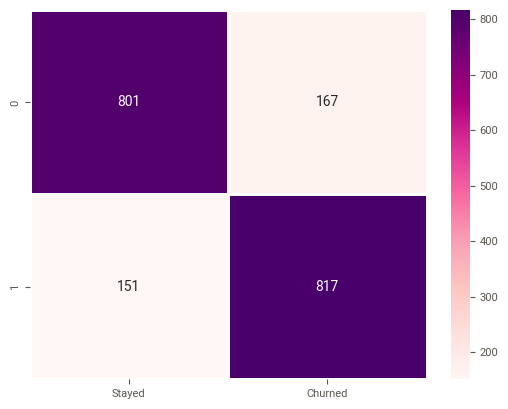

In [201]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(best_xgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.show()

When the confusion matrix after optimization is compared to the original confusion matrix from the original model in Section 6.3.4, we note that there is no difference between the performance of the model, hence we go with the best model(from 7.1 above).

## 8.0 Future Prediction

### 8.1 Random Forest

As concluded in Section 7 above, the selected model to be used for the predictions will be the Random Forest from the Oversampling method. As such, the data on which predictions are to be made will be oversampled

In [202]:
# Initializing the model (for shege reasons)
best_rf_model_rscv

RandomForestClassifier(bootstrap=False, max_depth=20, max_features='log2',
                       n_estimators=510, random_state=24)

In [203]:
# Oversampling the test data and confirming the shape
final_test_data = test_data.copy()
count_not_churned, count_churned = final_test_data["Churn"].value_counts()
count_not_churned, count_churned

(1291, 467)

In [204]:
# Filtering the observations for the 2 classes
test_not_churned = final_test_data[final_test_data["Churn"] == 0]
test_churned = final_test_data[final_test_data["Churn"] == 1]

In [205]:
# Oversampling the churned class and combining with the original dataframe
test_churn_oversampled = test_churned.sample(count_not_churned, replace=True)
test_oversampled = pd.concat([test_not_churned, test_churn_oversampled])

print("Random over-sampling:")
print(test_oversampled["Churn"].value_counts())

Random over-sampling:
0    1291
1    1291
Name: Churn, dtype: int64


In [206]:
# Defining the target & predictor variables
test_X = test_oversampled.drop(columns=["Churn"])
test_y = test_oversampled["Churn"]

In [207]:
# Scaling the test data columns
scaler = MinMaxScaler()
test_X[columns_to_scale] = scaler.fit_transform(test_X[columns_to_scale])
test_X

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,gender_Male,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
4720,1,0,0,0.887324,1,0,0.833583,0.770687,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,1,1,0,0,1,0
5767,0,1,0,0.901408,1,1,0.410795,0.437883,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0
212,0,0,1,0.845070,1,0,0.010495,0.127718,1,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,1
4423,0,0,0,0.450704,1,1,0.476762,0.257285,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0
2247,0,0,0,0.549296,1,0,0.009495,0.093749,0,0,0,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3310,1,0,0,0.000000,1,0,0.597201,0.006870,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1602,0,0,0,0.408451,1,1,0.715142,0.316215,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
3209,0,0,0,0.000000,1,1,0.751124,0.008650,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
39,0,0,0,0.140845,1,1,0.791104,0.125545,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0


In [209]:
# Predicting the test data
best_rf_pred = best_rf_model_rscv.predict(test_X)

# Evaluating the model
best_rf_report = classification_report(test_y, best_rf_pred, target_names= ["Stayed", "Churned"])
print(best_rf_report)

# Calculating the F2 Score
f2_score = fbeta_score(test_y, best_rf_pred, beta= 0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

              precision    recall  f1-score   support

      Stayed       0.62      0.86      0.72      1291
     Churned       0.78      0.48      0.59      1291

    accuracy                           0.67      2582
   macro avg       0.70      0.67      0.66      2582
weighted avg       0.70      0.67      0.66      2582

F2 Score: 0.69050


In [210]:
# Confusion Matrix
best_rf_conf_mat = confusion_matrix(test_y, best_rf_pred)
best_rf_conf_mat = (pd.DataFrame(best_rf_conf_mat).reset_index(drop=True)).rename(columns={0: "Stayed", 1: "Churned"})
best_rf_conf_mat

,Stayed,Churned
0,1113,178
1,673,618


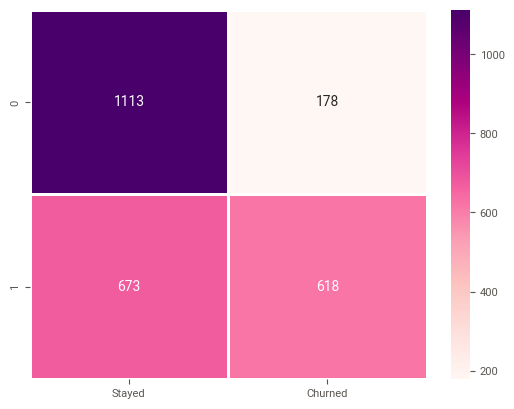

In [211]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(best_rf_conf_mat,
            annot= True,
            linewidth= 1.0,
            fmt= ".0f",
            cmap= "RdPu",
            ax= ax)
plt.show()

### 8.2 XGBoost

In [212]:
# A look at the parameters of the final XGB model
best_xgb_model

XGBClassifier(base_score=0.5, booster='dart', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.5,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.5, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=20, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=80, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=24,
              reg_alpha=0, reg_lambda=1, ...)

In [213]:
# Creating a copy of the the training dataframe for the SMOTE
smote_test = test_data.copy()

sm_X = smote_test.drop(columns=["Churn"])
sm_y = smote_test["Churn"]

# Resampling the dataframe using SMOTE
smote = SMOTE(sampling_strategy= "minority")
smote_X, smote_y = smote.fit_resample(sm_X, sm_y)
smote_y.value_counts()

0    1291
1    1291
Name: Churn, dtype: int64

In [214]:
# Scaling the numeric columns
scaler = MinMaxScaler()
smote_X[columns_to_scale] = scaler.fit_transform(smote_X[columns_to_scale])

In [215]:
# Predicting the test data
final_xgb_pred = best_xgb_model.predict(smote_X)

# Evaluating the model
final_xgb_report = classification_report(smote_y, final_xgb_pred, target_names= ["Stayed", "Churned"])
print(final_xgb_report)

# Calculating the F2 Score
f2_score = fbeta_score(smote_y, final_xgb_pred, beta=0.5)
f2_score = "{:.5f}".format(f2_score)
print("F2 Score:", f2_score)

              precision    recall  f1-score   support

      Stayed       0.78      0.81      0.79      1291
     Churned       0.80      0.77      0.78      1291

    accuracy                           0.79      2582
   macro avg       0.79      0.79      0.79      2582
weighted avg       0.79      0.79      0.79      2582

F2 Score: 0.79485


In [216]:
# Confusion Matrix
final_xgb_conf_mat = confusion_matrix(smote_y, final_xgb_pred)
final_xgb_conf_mat = (pd.DataFrame(final_xgb_conf_mat).reset_index(
    drop=True)).rename(columns={0: "Stayed", 1: "Churned"})
final_xgb_conf_mat

,Stayed,Churned
0,1048,243
1,303,988


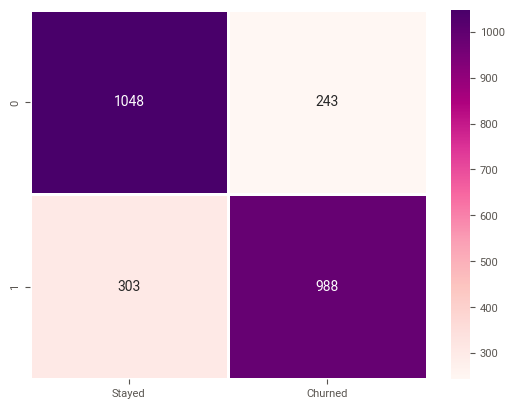

In [217]:
# Visualizing the Confusion Matrix
f, ax = plt.subplots()
sns.heatmap(final_xgb_conf_mat,
            annot=True,
            linewidth=1.0,
            fmt=".0f",
            cmap="RdPu",
            ax=ax)
plt.show()

## 9.0 Conclusion

### 9.1 Summary of Key Insights and Recommendations

1. Most of the churned customers had tenures within 1 - 29 months, and customers who passed the 29-month mark generally churned less.
2. Customers generally churned more when they crossed USD 56.15 monthly charge mark, with majority falling between USD 56.15 (lower quartile) and USD 79.65 (median monthly charge of churned customers)
3. Churn levels spiked most when monthly charges paid USD 64.45
4. Most of the customers who churned fell within USD 134.46 and USD 2,332.30. This is surprising and may be investigated further as it gives an indication that total charges may not be the sole reason for churn
5. Males are almost just as likely to churn as females. Hence, gender - like total charges - may not be a sole determinant for assessing the likelihood of churn
6. Customers without partners were about 67% more likely to churn that those with partners.
7. Fibre-optic service users were over twice as likely to churn as compared to DSL users (41.89% vs. 19.00%). Given that, ideally, fibre-optic is supposed to be faster (and better) than DSL, the churn proportion there was particularly worrying. Vodafone may want to investigate the reasons for high churn among customers. It may also review it's fibre-optic internet services and reach out to customers for more information.
8. Over 63% of internet service users did not use online security services. Since customers in this group were about 42% likely to churn, Vodafone may consider increased promotion for their online security services, as user of online security services did not churn much.
9. Less than 29% of customers used the Tech Support services and were 41.65% likely to churn. Given that tech support is critical to tech service delivery, Vodafone may want to bundle tech support offerings with other services to ensure that customers receive support as and when needed, and churn is reduced.
10. Internet service users who streamed (either TV or movies) were just as likely to churn as those who did not. This is concerning and raises questions about the streaming services offered by Vodafone. The company may want to evaluate their streaming services and ensure engagement with customers to improve the streaming service delivery and reduce churn among streamers. Improving this will mean that any customer who signs unto streaming services will be unlikely to churn.
11. The churn proportion for electronic checks (45.29%) is concerning, and should be investigated and improved to ensure convenience and ease of use for customers.

### 9.2 Conclusion

Per their confusion matrices and F2 scores, the XGBoost model (0.79 F2-score) generalizes and performs better on unseen data than the Random Forest model (0.69 F2-score). The XGBoost is therefore recommended for further optimization and deployment.